In [2]:
import shutil
import os
import sqlite3
import pandas as pd
import numpy as np
from sklearn import svm
from sklearn.svm import SVC, LinearSVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.tree import export_graphviz
import graphviz
from sklearn.ensemble import RandomForestClassifier

In [5]:

# # Create the `data` folder if it doesn't exist
# os.makedirs("data", exist_ok=True)
# print("`data` folder created or already exists.")

# # Current location of `agri.db`
# source = ".../agri.db"

# Destination path in the `data` folder
destination = "data/agri.db"

# # Move the file
# shutil.move(source, destination)
# print("`agri.db` moved to the `data` folder.")

# Connect to the database
connection = sqlite3.connect(destination)

# Example: Read table names
cursor = connection.cursor()
cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = cursor.fetchall()
print("Tables in the database:", tables)



table_name = "farm_data"  # Replace with the actual table name

# Load the table into a DataFrame
plants_df = pd.read_sql_query(f"SELECT * FROM {table_name}", connection)

# Print the DataFrame
print(plants_df)

# Close the connection when done
connection.close()

In [6]:
plants_df.head()

,System Location Code,Previous Cycle Plant Type,Plant Type,Plant Stage,Temperature Sensor (°C),Humidity Sensor (%),Light Intensity Sensor (lux),CO2 Sensor (ppm),EC Sensor (dS/m),O2 Sensor (ppm),Nutrient N Sensor (ppm),Nutrient P Sensor (ppm),Nutrient K Sensor (ppm),pH Sensor,Water Level Sensor (mm)
0,Zone_D,Herbs,Vine Crops,Maturity,23.34,NaN,454.0,937,1.82,4,161,64,201,6.1,28.150346
1,Zone_G,Herbs,VINE CROPS,Vegetative,-24.16,63.14,441.0,938,2.13,6,161,53,None,6.5,31.000000
2,Zone_F,Herbs,herbs,maturity,23.84,NaN,562.0,1246,1.21,8,228,79,292,6.4,26.000000
3,Zone_G,Herbs,fruiting vegetables,Vegetative,22.61,NaN,651.0,1346,1.96,6,None,53 ppm,289,6.6,NaN
4,Zone_B,Vine Crops,LEAFY GREENS,seedling,22.88,NaN,144.0,812,2.76,5,61,19,168,5.5,28.000000


## Exploring Dataset

In [7]:
# List of categorical columns
categorical_columns = ['System Location Code', 'Previous Cycle Plant Type', 'Plant Type', 'Plant Stage']
# List of numerical columns
numerical_columns = [
    'Temperature Sensor (°C)',
    'Humidity Sensor (%)',
    'Light Intensity Sensor (lux)',
    'CO2 Sensor (ppm)',
    'EC Sensor (dS/m)',
    'O2 Sensor (ppm)',
    'Nutrient N Sensor (ppm)',
    'Nutrient P Sensor (ppm)',
    'Nutrient K Sensor (ppm)',
    'pH Sensor',
    'Water Level Sensor (mm)'
]

In [8]:
plants_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57489 entries, 0 to 57488
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   System Location Code          57489 non-null  object 
 1   Previous Cycle Plant Type     57489 non-null  object 
 2   Plant Type                    57489 non-null  object 
 3   Plant Stage                   57489 non-null  object 
 4   Temperature Sensor (°C)       48800 non-null  float64
 5   Humidity Sensor (%)           18622 non-null  float64
 6   Light Intensity Sensor (lux)  53211 non-null  float64
 7   CO2 Sensor (ppm)              57489 non-null  int64  
 8   EC Sensor (dS/m)              57489 non-null  float64
 9   O2 Sensor (ppm)               57489 non-null  int64  
 10  Nutrient N Sensor (ppm)       47515 non-null  object 
 11  Nutrient P Sensor (ppm)       51791 non-null  object 
 12  Nutrient K Sensor (ppm)       53788 non-null  object 
 13  p

In [9]:
# Change data type of categorical features to string
for col in categorical_columns:
    plants_df[col] = plants_df[col].astype('string')

In [10]:

# Check for non-numeric entries in each column
for column in numerical_columns:
    # Find rows with non-numeric values
    non_numeric_rows = plants_df[~plants_df[column].apply(lambda x: str(x).replace('.', '', 1).isdigit() if pd.notnull(x) else True)]
    if not non_numeric_rows.empty:
        print(f"Non-numeric values found in column '{column}':")
        print(non_numeric_rows[[column]])

Non-numeric values found in column 'Temperature Sensor (°C)':
       Temperature Sensor (°C)
1                       -24.16
31                      -24.64
51                      -22.96
52                      -22.96
81                      -22.57
...                        ...
56970                   -25.12
57181                   -23.20
57277                   -21.60
57383                   -22.02
57427                   -23.24

[1252 rows x 1 columns]
Non-numeric values found in column 'Light Intensity Sensor (lux)':
       Light Intensity Sensor (lux)
36                           -105.0
37                           -105.0
49                           -598.0
133                          -558.0
140                          -245.0
...                             ...
57246                        -342.0
57247                        -342.0
57256                        -494.0
57325                        -582.0
57396                        -498.0

[1385 rows x 1 columns]
Non-numeric value

There are some numeric columns with string values, hence we will replace them with the median

In [11]:
# List of columns with units
columns_with_units = ['Nutrient N Sensor (ppm)', 'Nutrient P Sensor (ppm)', 'Nutrient K Sensor (ppm)']

for column in columns_with_units:
    # Remove ' ppm' and convert to numeric
    plants_df[column] = plants_df[column].str.replace(' ppm', '').astype(float)


In [12]:
plants_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57489 entries, 0 to 57488
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   System Location Code          57489 non-null  string 
 1   Previous Cycle Plant Type     57489 non-null  string 
 2   Plant Type                    57489 non-null  string 
 3   Plant Stage                   57489 non-null  string 
 4   Temperature Sensor (°C)       48800 non-null  float64
 5   Humidity Sensor (%)           18622 non-null  float64
 6   Light Intensity Sensor (lux)  53211 non-null  float64
 7   CO2 Sensor (ppm)              57489 non-null  int64  
 8   EC Sensor (dS/m)              57489 non-null  float64
 9   O2 Sensor (ppm)               57489 non-null  int64  
 10  Nutrient N Sensor (ppm)       47515 non-null  float64
 11  Nutrient P Sensor (ppm)       51791 non-null  float64
 12  Nutrient K Sensor (ppm)       53788 non-null  float64
 13  p

From the info() output, some columns that should be numeric (Nutrient N Sensor (ppm), Nutrient P Sensor (ppm), Nutrient K Sensor (ppm)) are stored as object.

#### Check the Total Number of Missing Values Per Column

In [13]:
# Check for missing values in each column
missing_values = plants_df.isnull().sum()
print("Missing values per column:")
print(missing_values)


Missing values per column:
System Location Code                0
Previous Cycle Plant Type           0
Plant Type                          0
Plant Stage                         0
Temperature Sensor (°C)          8689
Humidity Sensor (%)             38867
Light Intensity Sensor (lux)     4278
CO2 Sensor (ppm)                    0
EC Sensor (dS/m)                    0
O2 Sensor (ppm)                     0
Nutrient N Sensor (ppm)          9974
Nutrient P Sensor (ppm)          5698
Nutrient K Sensor (ppm)          3701
pH Sensor                           0
Water Level Sensor (mm)          8642
dtype: int64


Only the numerical features has missing values, specifically we identified **Temperature Sensor (°C)**, **Humidity Sensor (%)  **, **Light Intensity Sensor (lux)**, **Nutrient N Sensor (ppm)**, **Nutrient P Sensor (ppm)**, **Nutrient K Sensor (ppm)**, and **Water Level Sensor (mm)** with missing values.

### Remove Duplicates

In [14]:
# Check for duplicate rows
duplicate_rows = plants_df[plants_df.duplicated()]
print(f"Number of duplicate rows: {duplicate_rows.shape[0]}")

# Display the duplicate rows
if not duplicate_rows.empty:
    print("Duplicate rows:")
    print(duplicate_rows)

    # Remove entire duplicate rows
plants_df = plants_df.drop_duplicates()


Number of duplicate rows: 7489
Duplicate rows:
      System Location Code Previous Cycle Plant Type           Plant Type  \
8                   Zone_G                     Herbs         Leafy Greens   
15                  Zone_B                     Herbs  Fruiting Vegetables   
29                  Zone_C              Leafy Greens         Leafy Greens   
37                  Zone_B                Vine Crops         Leafy Greens   
40                  Zone_F                     Herbs                Herbs   
...                    ...                       ...                  ...   
57446               Zone_A              Leafy Greens  Fruiting Vegetables   
57455               Zone_D                Vine Crops           Vine Crops   
57468               Zone_A              Leafy Greens         Leafy Greens   
57477               Zone_A       Fruiting Vegetables  Fruiting Vegetables   
57485               Zone_C                Vine Crops  Fruiting Vegetables   

      Plant Stage  Temperatu

### Understanding Categorical Features

In [15]:
# Loop through each column to check unique values
for column in categorical_columns:
    unique_values = plants_df[column].unique()
    print(f"Unique values in '{column}':")
    print(unique_values)
    print("-" * 50)


Unique values in 'System Location Code':
<StringArray>
['Zone_D', 'Zone_G', 'Zone_F', 'Zone_B', 'Zone_C', 'Zone_A', 'Zone_E']
Length: 7, dtype: string
--------------------------------------------------
Unique values in 'Previous Cycle Plant Type':
<StringArray>
['Herbs', 'Vine Crops', 'Leafy Greens', 'Fruiting Vegetables']
Length: 4, dtype: string
--------------------------------------------------
Unique values in 'Plant Type':
<StringArray>
[         'Vine Crops',          'VINE CROPS',               'herbs',
 'fruiting vegetables',        'LEAFY GREENS', 'FRUITING VEGETABLES',
        'Leafy Greens',               'Herbs', 'Fruiting Vegetables',
               'HERBS',          'vine crops',        'leafy greens']
Length: 12, dtype: string
--------------------------------------------------
Unique values in 'Plant Stage':
<StringArray>
[  'Maturity', 'Vegetative',   'maturity',   'seedling',   'MATURITY',
   'Seedling',   'SEEDLING', 'VEGETATIVE', 'vegetative']
Length: 9, dtype: strin

In [16]:
# Standardize specific columns using mapping
plants_df['Plant Type'] = plants_df['Plant Type'].replace({
    'vine crops': 'Vine Crops',
    'VINE CROPS': 'Vine Crops',
    'herbs': 'Herbs',
    'HERBS': 'Herbs',
    'leafy greens': 'Leafy Greens',
    'LEAFY GREENS': 'Leafy Greens',
    'fruiting vegetables': 'Fruiting Vegetables',
    'FRUITING VEGETABLES': 'Fruiting Vegetables'
})

plants_df['Plant Stage'] = plants_df['Plant Stage'].replace({
    'maturity': 'Maturity',
    'MATURITY': 'Maturity',
    'seedling': 'Seedling',
    'SEEDLING': 'Seedling',
    'vegetative': 'Vegetative',
    'VEGETATIVE': 'Vegetative'
})


We fixed the naming conventions, and standardise them

In [18]:

for col in categorical_columns:
    print(f"Value counts for {col}:")
    print(plants_df[col].value_counts())
    print("\n")


Value counts for System Location Code:
System Location Code
Zone_C    7218
Zone_G    7206
Zone_E    7204
Zone_B    7200
Zone_A    7075
Zone_F    7071
Zone_D    7026
Name: count, dtype: Int64


Value counts for Previous Cycle Plant Type:
Previous Cycle Plant Type
Fruiting Vegetables    12592
Leafy Greens           12568
Vine Crops             12459
Herbs                  12381
Name: count, dtype: Int64


Value counts for Plant Type:
Plant Type
Fruiting Vegetables    12559
Herbs                  12528
Leafy Greens           12502
Vine Crops             12411
Name: count, dtype: Int64


Value counts for Plant Stage:
Plant Stage
Seedling      16854
Vegetative    16608
Maturity      16538
Name: count, dtype: Int64




#### Visualisation for Categorical Features

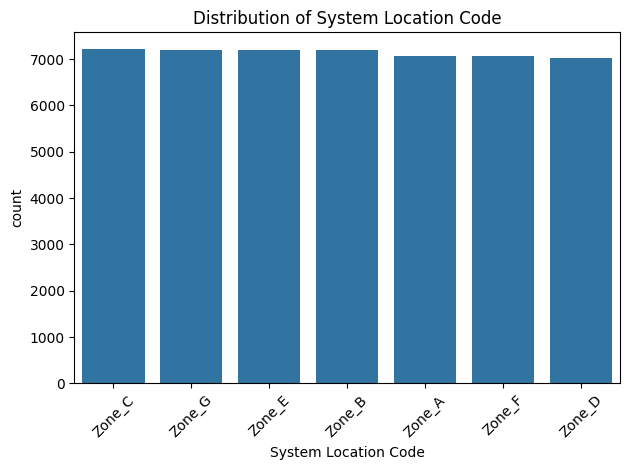

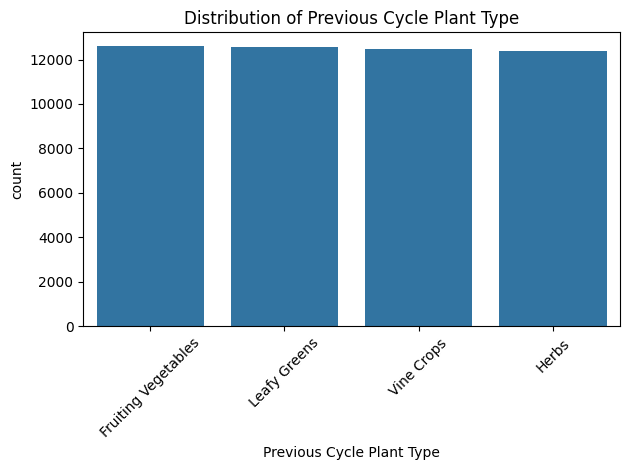

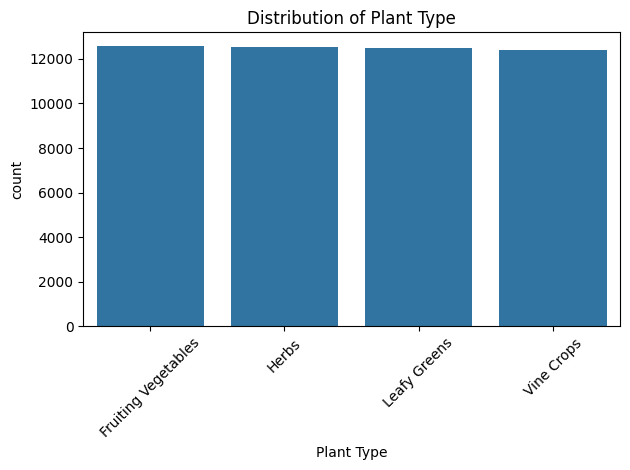

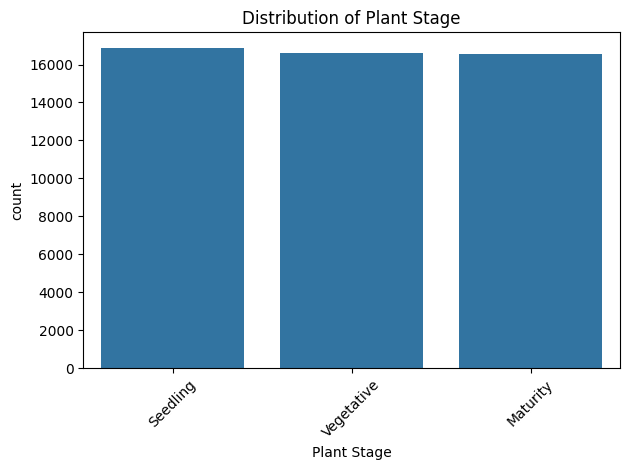

In [19]:
for col in categorical_columns:
    sns.countplot(x=col, data=plants_df, order=plants_df[col].value_counts().index)
    plt.title(f"Distribution of {col}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


Our dataset has too many categories with small differences, we will combine Plant type and Plant stage into Plant type-Stage

#### For Task 2, we categorise combine Plant type-Stage

In [20]:
# Combine 'Plant Type' and 'Plant Stage' into a new column
plants_df['Plant Type-Stage'] = plants_df['Plant Type'] + '-' + plants_df['Plant Stage']

# Display the updated DataFrame
print(plants_df.head())


  System Location Code Previous Cycle Plant Type           Plant Type  \
0               Zone_D                     Herbs           Vine Crops   
1               Zone_G                     Herbs           Vine Crops   
2               Zone_F                     Herbs                Herbs   
3               Zone_G                     Herbs  Fruiting Vegetables   
4               Zone_B                Vine Crops         Leafy Greens   

  Plant Stage  Temperature Sensor (°C)  Humidity Sensor (%)  \
0    Maturity                    23.34                  NaN   
1  Vegetative                   -24.16                63.14   
2    Maturity                    23.84                  NaN   
3  Vegetative                    22.61                  NaN   
4    Seedling                    22.88                  NaN   

   Light Intensity Sensor (lux)  CO2 Sensor (ppm)  EC Sensor (dS/m)  \
0                         454.0               937              1.82   
1                         441.0         

In [21]:
# Extract unique values
unique_values = plants_df['Plant Type-Stage'].unique()

# Sort by plant type (part before the hyphen)
sorted_values = sorted(unique_values, key=lambda x: x.split('-')[0])

# Print sorted values
print(sorted_values)



['Fruiting Vegetables-Vegetative', 'Fruiting Vegetables-Maturity', 'Fruiting Vegetables-Seedling', 'Herbs-Maturity', 'Herbs-Seedling', 'Herbs-Vegetative', 'Leafy Greens-Seedling', 'Leafy Greens-Maturity', 'Leafy Greens-Vegetative', 'Vine Crops-Maturity', 'Vine Crops-Vegetative', 'Vine Crops-Seedling']


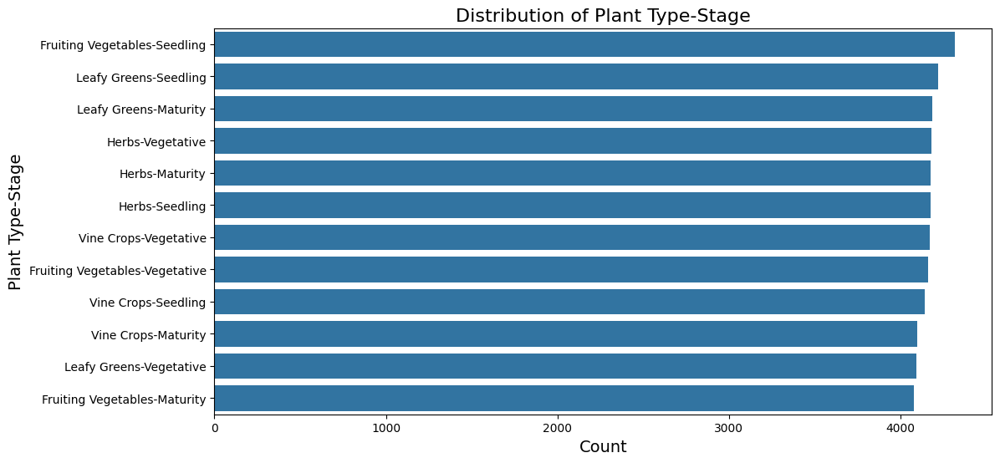

In [22]:
# Count plot for `Plant Type-Stage`
plt.figure(figsize=(12, 6))
sns.countplot(y='Plant Type-Stage', data=plants_df, order=plants_df['Plant Type-Stage'].value_counts().index)
plt.title('Distribution of Plant Type-Stage', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Plant Type-Stage', fontsize=14)
plt.show()

The categories for each plant type-stage is quite balanced, so we do not need to balance them

### Understanding Numerical Features

In [23]:
plants_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Temperature Sensor (°C),42416.0,22.161807,7.483871,-28.570000,22.140000,23.21,24.35,28.750000
Humidity Sensor (%),16214.0,69.230421,5.728011,59.220000,64.340000,68.66,74.10,81.140000
Light Intensity Sensor (lux),46276.0,398.339485,222.320399,-799.000000,257.000000,404.00,553.00,800.000000
CO2 Sensor (ppm),50000.0,1083.223440,172.529164,799.000000,950.000000,1071.00,1178.00,1500.000000
EC Sensor (dS/m),50000.0,1.624247,0.415122,-0.250000,1.360000,1.65,1.90,3.440000
O2 Sensor (ppm),50000.0,6.581000,1.147460,3.000000,6.000000,7.00,7.00,11.000000
Nutrient N Sensor (ppm),41328.0,157.768849,45.632916,49.000000,124.000000,158.00,190.00,250.000000
Nutrient P Sensor (ppm),45042.0,49.865526,15.416017,19.000000,37.000000,50.00,62.00,80.000000
Nutrient K Sensor (ppm),46781.0,218.062696,60.723034,99.000000,170.000000,215.00,266.00,350.000000
pH Sensor,50000.0,6.021598,0.400561,3.800000,5.800000,6.00,6.30,7.800000


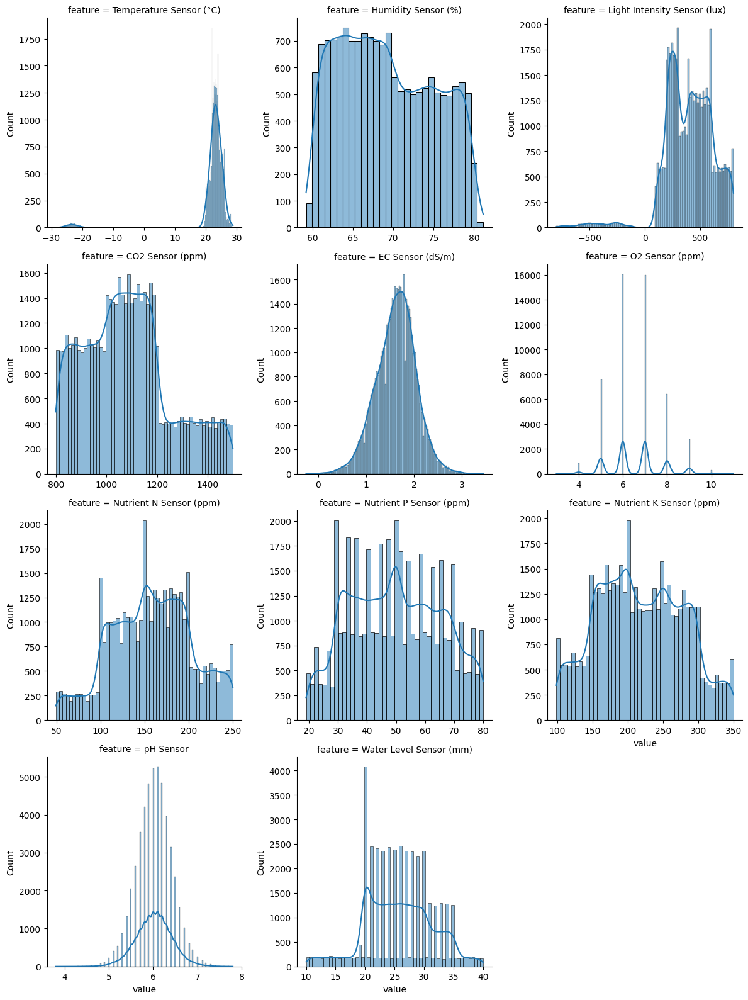

In [24]:
# Select only numerical features

plants_df_melted = plants_df[numerical_columns].melt(var_name='feature', value_name='value')

# Create FacetGrid for numerical features
g = sns.FacetGrid(plants_df_melted, col='feature', col_wrap=3, height=4, sharex=False, sharey=False)
g.map(sns.histplot, 'value', kde=True)


plt.tight_layout()
plt.show()

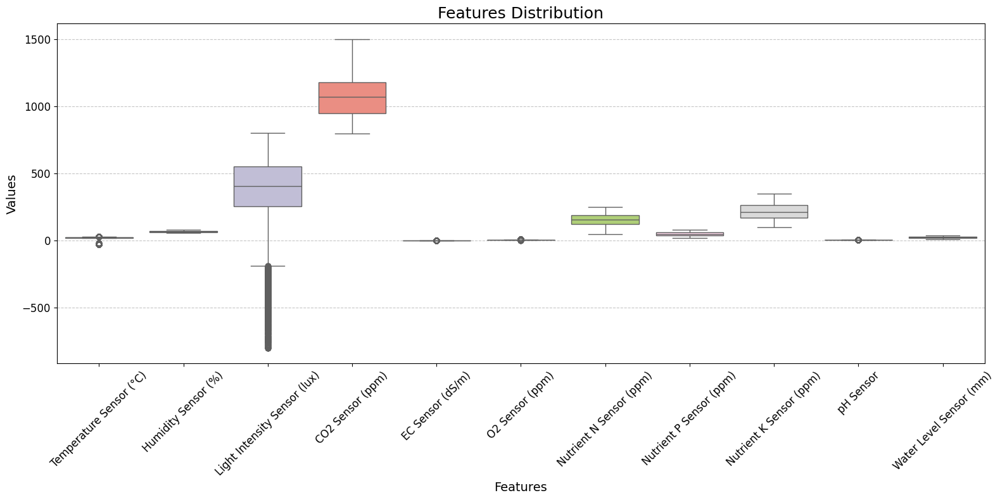

In [25]:
numerical_df = plants_df.select_dtypes(include=['number'])


plt.figure(figsize=(16, 8))

sns.boxplot(data=numerical_df, palette="Set3")

plt.title("Features Distribution", fontsize=18)
plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis labels for readability
plt.yticks(fontsize=12)
plt.xlabel("Features", fontsize=14)
plt.ylabel("Values", fontsize=14)


plt.grid(axis='y', linestyle='--', alpha=0.7)


plt.tight_layout()


plt.show()


From the distributions, we can observe that Temperature Sensor and Light Intensity Sensor has outliers (negative values). We will explore the rows with negative values.

#### Analysing Negative values in Temperature Sensor and Light Intensity Sensor

In [26]:
# Check negative values in Temperature Sensor
negative_temperature = plants_df[plants_df['Temperature Sensor (°C)'] < 0]
print("Negative values in Temperature Sensor (°C):")
print(negative_temperature)

# Check negative values in Light Intensity Sensor
negative_light_intensity = plants_df[plants_df['Light Intensity Sensor (lux)'] < 0]
print("Negative values in Light Intensity Sensor (lux):")
print(negative_light_intensity)


Negative values in Temperature Sensor (°C):
      System Location Code Previous Cycle Plant Type           Plant Type  \
1                   Zone_G                     Herbs           Vine Crops   
31                  Zone_C                Vine Crops  Fruiting Vegetables   
51                  Zone_F                Vine Crops  Fruiting Vegetables   
81                  Zone_B                     Herbs                Herbs   
173                 Zone_A              Leafy Greens         Leafy Greens   
...                    ...                       ...                  ...   
56970               Zone_D              Leafy Greens                Herbs   
57181               Zone_A                Vine Crops                Herbs   
57277               Zone_G              Leafy Greens  Fruiting Vegetables   
57383               Zone_D              Leafy Greens           Vine Crops   
57427               Zone_E                Vine Crops  Fruiting Vegetables   

      Plant Stage  Temperature 

In [27]:
# Rows with negative Temperature Sensor values
negative_temperature_rows = plants_df[plants_df['Temperature Sensor (°C)'] < 0]

# Rows with negative Light Intensity Sensor values
negative_light_intensity_rows = plants_df[plants_df['Light Intensity Sensor (lux)'] < 0]

# Analyze Plant Type-Stage for negative Temperature Sensor values
print("Plant Type-Stage for negative Temperature Sensor values:")
print(negative_temperature_rows['Plant Type-Stage'].value_counts())

# Analyze Plant Type-Stage for negative Light Intensity Sensor values
print("\nPlant Type-Stage for negative Light Intensity Sensor values:")
print(negative_light_intensity_rows['Plant Type-Stage'].value_counts())


Plant Type-Stage for negative Temperature Sensor values:
Plant Type-Stage
Herbs-Seedling                    110
Leafy Greens-Maturity              99
Fruiting Vegetables-Seedling       94
Vine Crops-Vegetative              89
Vine Crops-Maturity                89
Leafy Greens-Seedling              88
Herbs-Vegetative                   86
Herbs-Maturity                     84
Vine Crops-Seedling                84
Fruiting Vegetables-Maturity       84
Fruiting Vegetables-Vegetative     79
Leafy Greens-Vegetative            79
Name: count, dtype: Int64

Plant Type-Stage for negative Light Intensity Sensor values:
Plant Type-Stage
Fruiting Vegetables-Seedling      118
Leafy Greens-Maturity             113
Leafy Greens-Vegetative           110
Leafy Greens-Seedling             104
Herbs-Vegetative                  104
Fruiting Vegetables-Maturity      100
Vine Crops-Maturity                99
Herbs-Seedling                     95
Vine Crops-Vegetative              95
Vine Crops-Seedling    

The proportion of negative Temperature Sensor values is 2.1% while proportion of negative Light Intensity Sensor is 2.4%.

The number of negative records relative to the dataset size (50000 rows) is so small that either replacing or removing them will not significantly affect downstream analysis or model training.

These negative values likely represent sensor errors or rare anomalies, so addressing them ensures a clean dataset for analysis.

The negative temperature is unlikely for plants as it is enough to kill plants, so we deem it as a data entry error.

light intensity sensor (lux) values cannot physically be negative, as 0 already suggests there is complete darkness. Negative lux values are not meaningful in physical terms and we will treat it with median.



In [28]:
# Calculate and display medians for Light Intensity Sensor (lux) excluding negatives
light_medians_excluding_negatives = plants_df[plants_df['Light Intensity Sensor (lux)'] >= 0].groupby('Plant Type-Stage')['Light Intensity Sensor (lux)'].median()
print("Medians for Light Intensity Sensor (lux) excluding negatives:")
print(light_medians_excluding_negatives)
print()

# Calculate and display medians for Temperature Sensor (°C) excluding negatives
temperature_medians_excluding_negatives = plants_df[plants_df['Temperature Sensor (°C)'] >= 0].groupby('Plant Type-Stage')['Temperature Sensor (°C)'].median()
print("Medians for Temperature Sensor (°C) excluding negatives:")
print(temperature_medians_excluding_negatives)
print()


Medians for Light Intensity Sensor (lux) excluding negatives:
Plant Type-Stage
Fruiting Vegetables-Maturity      699.0
Fruiting Vegetables-Seedling      499.0
Fruiting Vegetables-Vegetative    702.0
Herbs-Maturity                    454.0
Herbs-Seedling                    249.0
Herbs-Vegetative                  447.0
Leafy Greens-Maturity             298.0
Leafy Greens-Seedling             149.0
Leafy Greens-Vegetative           300.0
Vine Crops-Maturity               498.0
Vine Crops-Seedling               249.0
Vine Crops-Vegetative             500.0
Name: Light Intensity Sensor (lux), dtype: float64

Medians for Temperature Sensor (°C) excluding negatives:
Plant Type-Stage
Fruiting Vegetables-Maturity      25.01
Fruiting Vegetables-Seedling      25.04
Fruiting Vegetables-Vegetative    23.03
Herbs-Maturity                    23.00
Herbs-Seedling                    24.98
Herbs-Vegetative                  23.02
Leafy Greens-Maturity             20.98
Leafy Greens-Seedling             2

In [29]:
# Replace negative Light Intensity Sensor (lux) values with median excluding negatives
plants_df['Light Intensity Sensor (lux)'] = plants_df.groupby('Plant Type-Stage')['Light Intensity Sensor (lux)'].transform(
    lambda x: x.mask(x < 0, x[x >= 0].median())
)

# Replace negative Temperature Sensor (°C) values with median excluding negatives
plants_df['Temperature Sensor (°C)'] = plants_df.groupby('Plant Type-Stage')['Temperature Sensor (°C)'].transform(
    lambda x: x.mask(x < 0, x[x >= 0].median())
)

# Verify if there are any remaining negative values
negative_light_count = (plants_df['Light Intensity Sensor (lux)'] < 0).sum()
negative_temperature_count = (plants_df['Temperature Sensor (°C)'] < 0).sum()

print(f"Remaining negative values in Light Intensity Sensor (lux): {negative_light_count}")
print(f"Remaining negative values in Temperature Sensor (°C): {negative_temperature_count}")


Remaining negative values in Light Intensity Sensor (lux): 0
Remaining negative values in Temperature Sensor (°C): 0


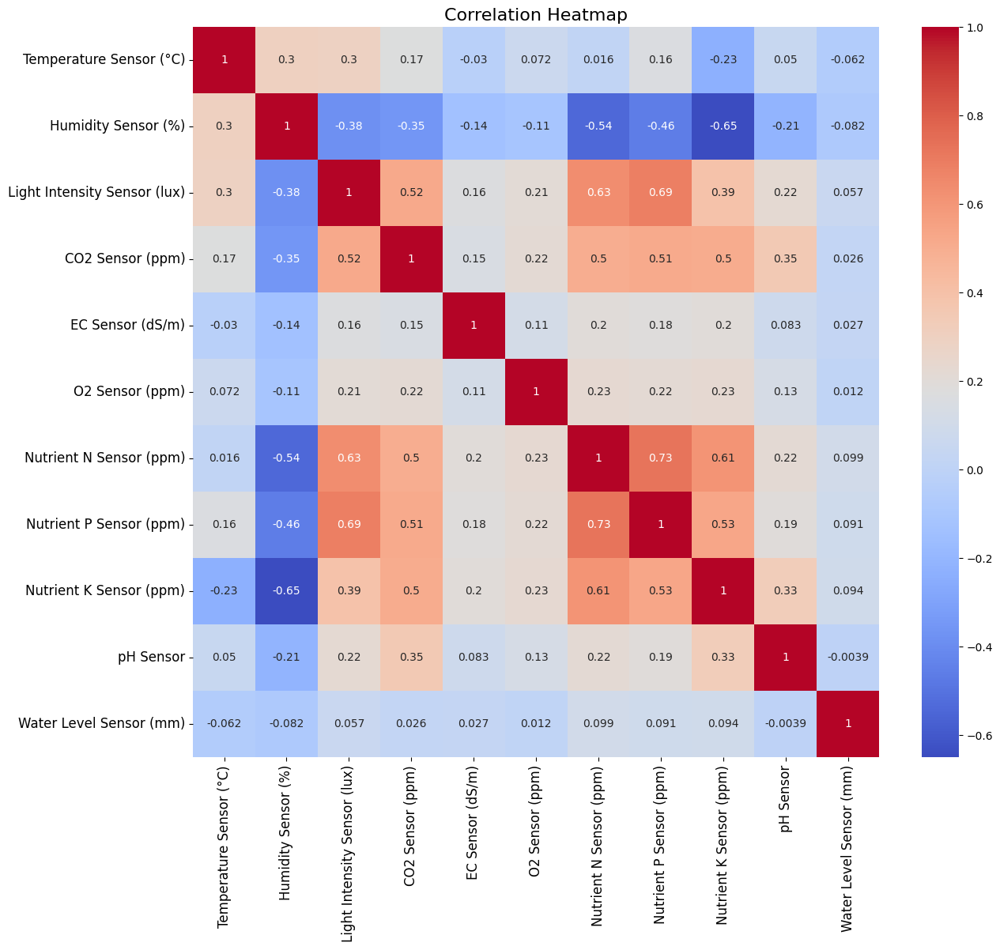

In [30]:

numerical_df = plants_df[numerical_columns]

# Compute the correlation matrix
corr_matrix = numerical_df.corr()

plt.figure(figsize=(14, 12))  # Larger size
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', annot_kws={"size": 10})  # Adjust annotation font size
plt.title("Correlation Heatmap", fontsize=16)  # Title font size
plt.xticks(fontsize=12)  # X-axis labels font size
plt.yticks(fontsize=12)  # Y-axis labels font size
plt.show()


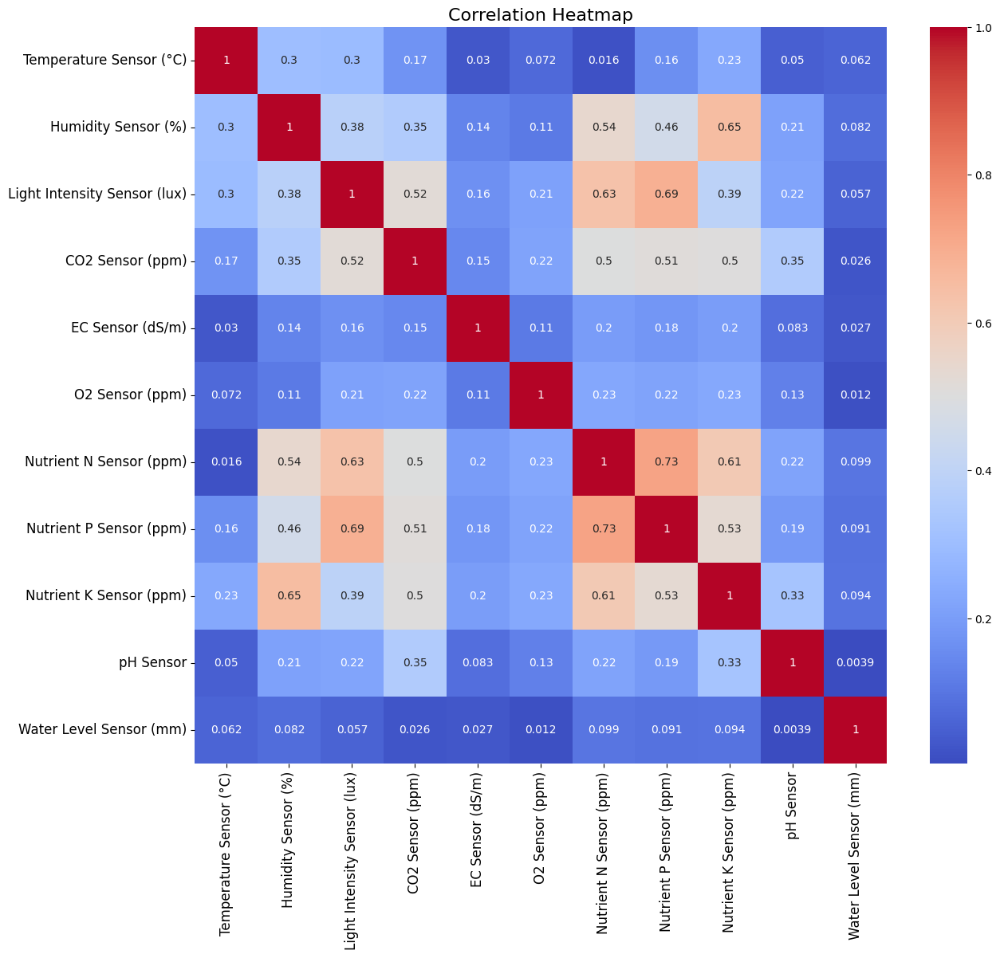

In [31]:
abs_corr_matrix = corr_matrix.abs()
plt.figure(figsize=(14, 12))  # Larger size
sns.heatmap(abs_corr_matrix, annot=True, cmap='coolwarm', annot_kws={"size": 10})  # Adjust annotation font size
plt.title("Correlation Heatmap", fontsize=16)  # Title font size
plt.xticks(fontsize=12)  # X-axis labels font size
plt.yticks(fontsize=12)  # Y-axis labels font size
plt.show()


From the correlation, we can observe there is a non-linear relationship between temperature sensor and the other numerical columns. Hence we cannot use Linear Regression. We will use other machine learning models like Random Forest, XGBoost and Neural Networks instead.

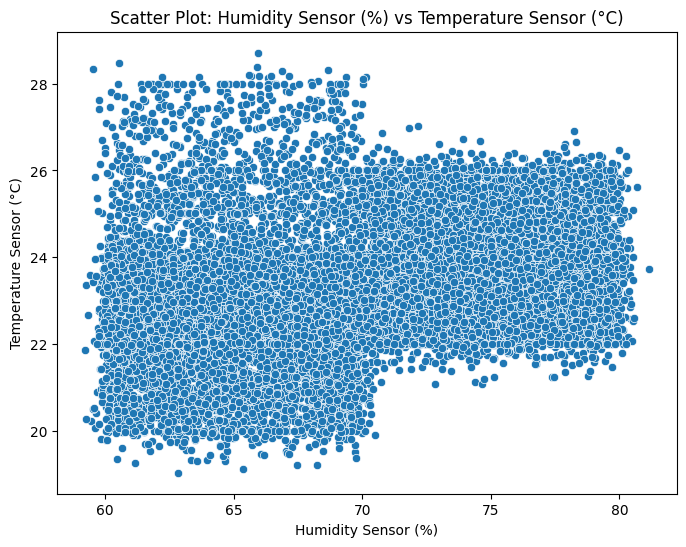

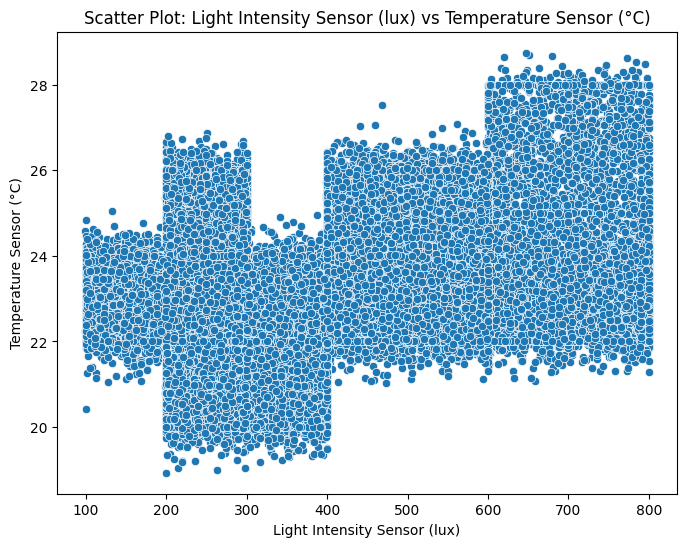

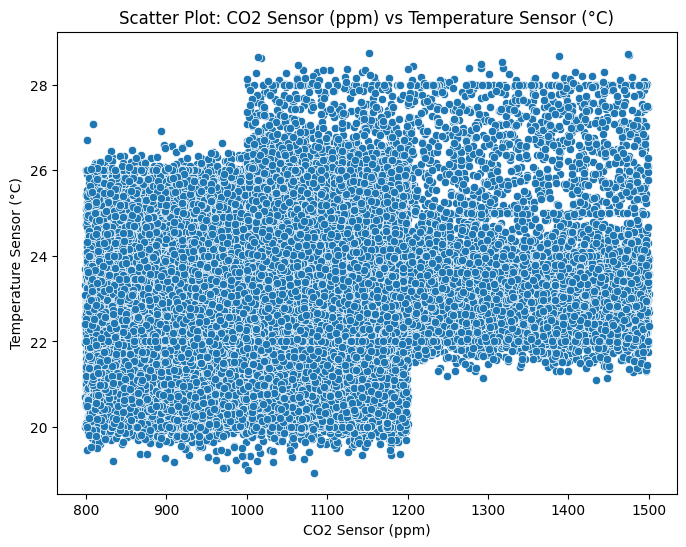

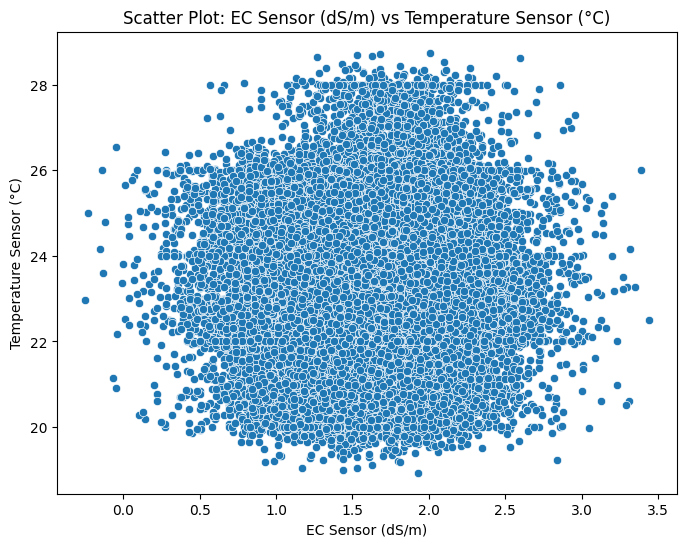

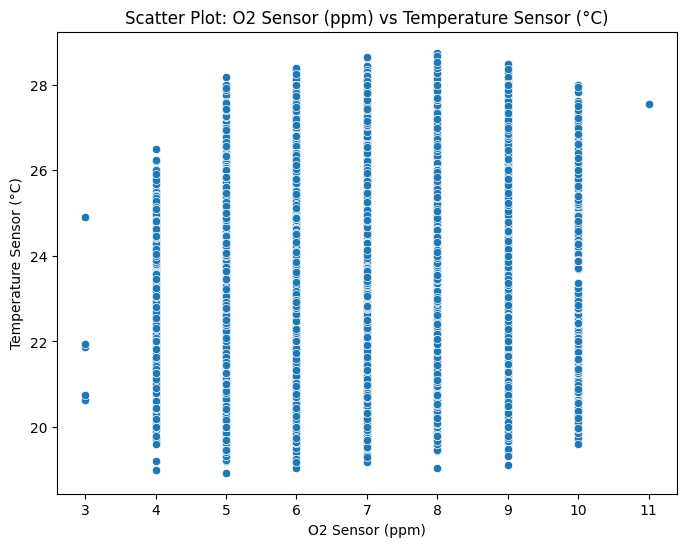

...

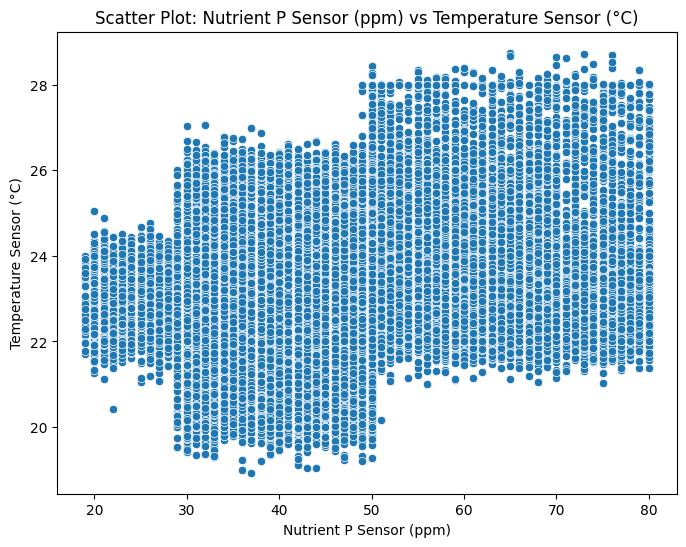

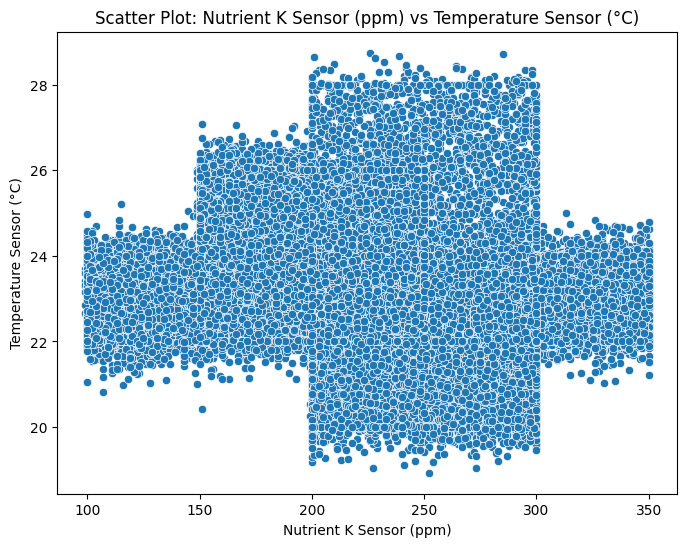

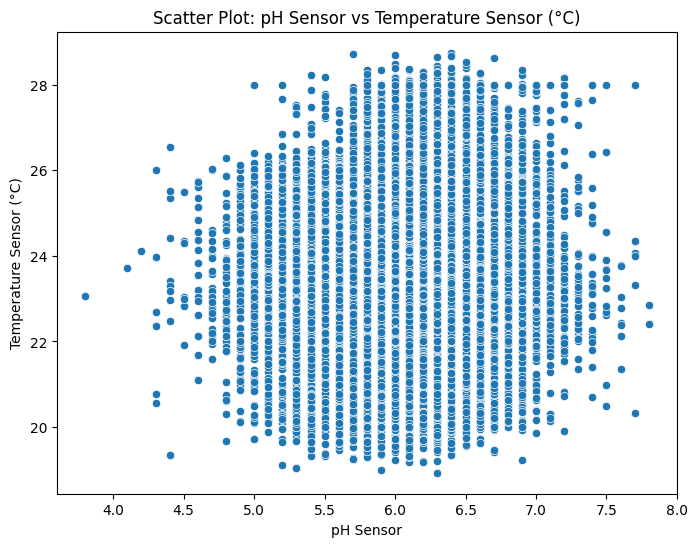

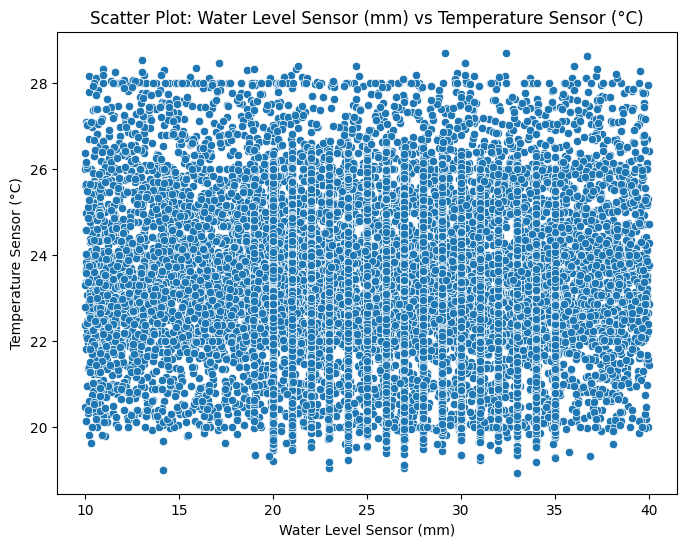

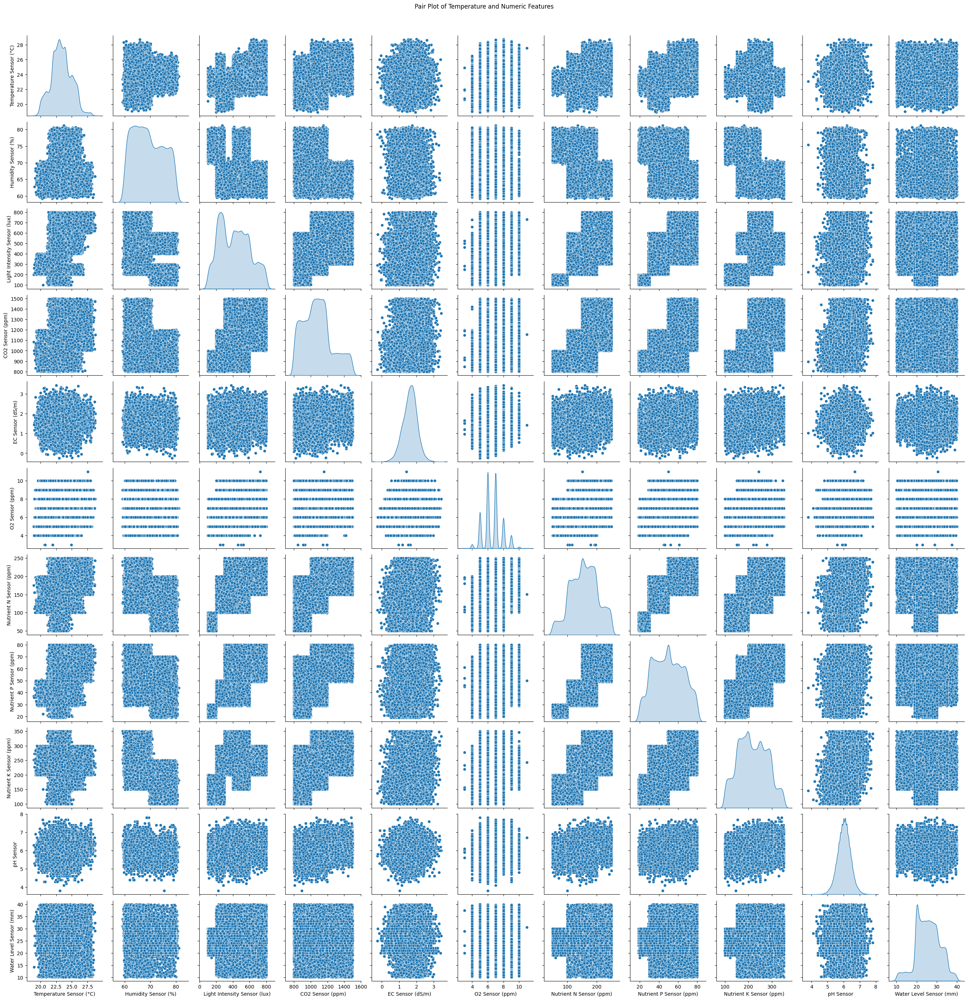

In [32]:
# List of numeric features to plot against temperature
numeric_features = [
    'Humidity Sensor (%)', 'Light Intensity Sensor (lux)', 'CO2 Sensor (ppm)',
    'EC Sensor (dS/m)', 'O2 Sensor (ppm)', 'Nutrient N Sensor (ppm)',
    'Nutrient P Sensor (ppm)', 'Nutrient K Sensor (ppm)', 'pH Sensor',
    'Water Level Sensor (mm)'
]

# Scatter plots
for feature in numeric_features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=plants_df[feature], y=plants_df['Temperature Sensor (°C)'])
    plt.title(f"Scatter Plot: {feature} vs Temperature Sensor (°C)")
    plt.xlabel(feature)
    plt.ylabel('Temperature Sensor (°C)')
    plt.show()

# Pair plot
sns.pairplot(plants_df, vars=['Temperature Sensor (°C)'] + numeric_features, diag_kind='kde')
plt.suptitle("Pair Plot of Temperature and Numeric Features", y=1.02)
plt.show()


Random forests, gradient boosting, and neural networks, can capture non-linear relationships effectively.


Predictive Power in Non-Linearity:

If the data points are scattered non-linearly but show patterns (e.g., clusters, plateaus, or bands), it indicates that relationships exist, though they are not linear.



#### Distribution of Columns with Missing Values by Plant type-Stage

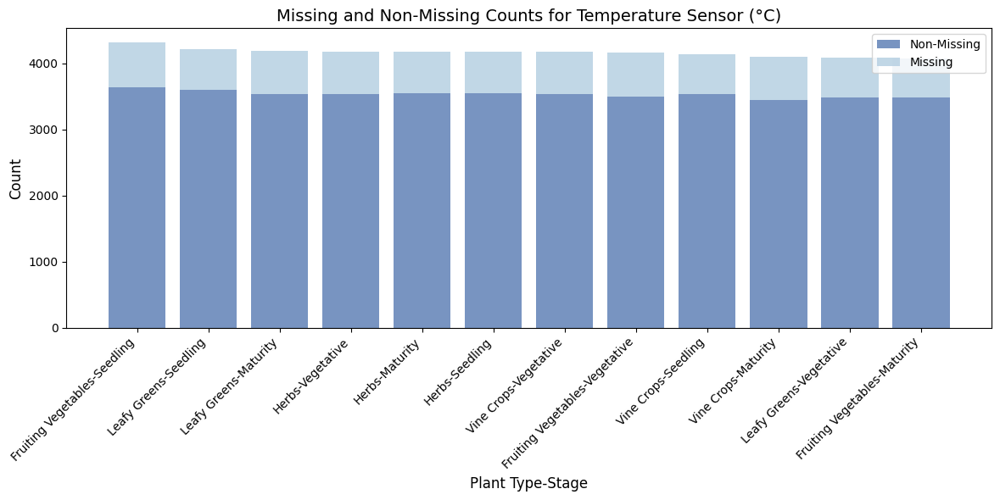

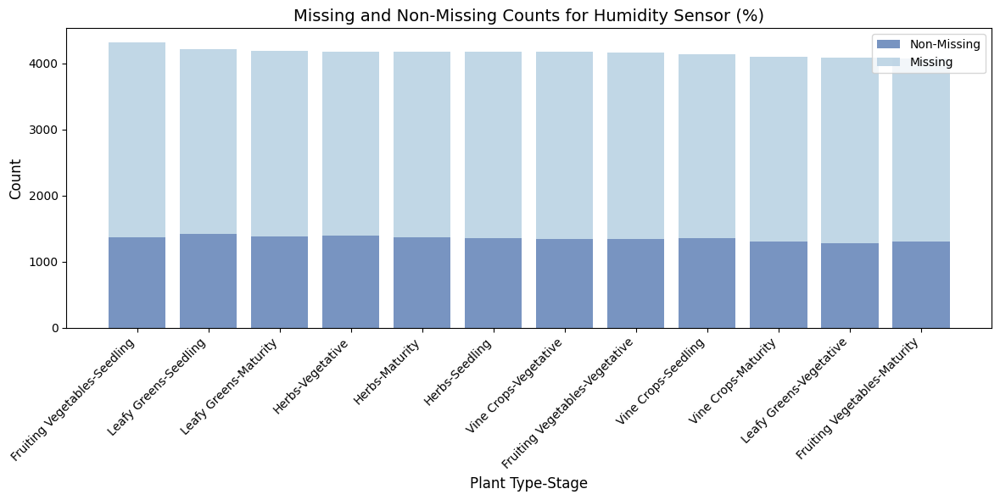

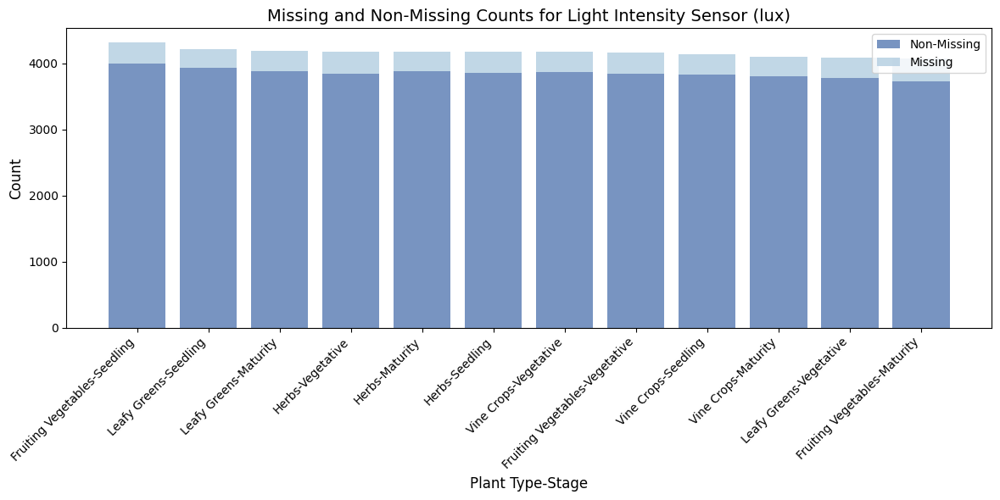

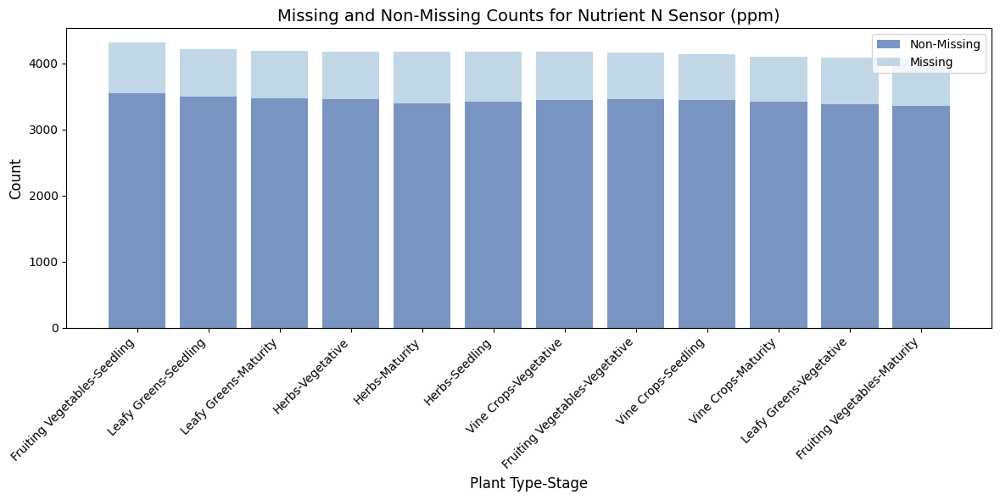

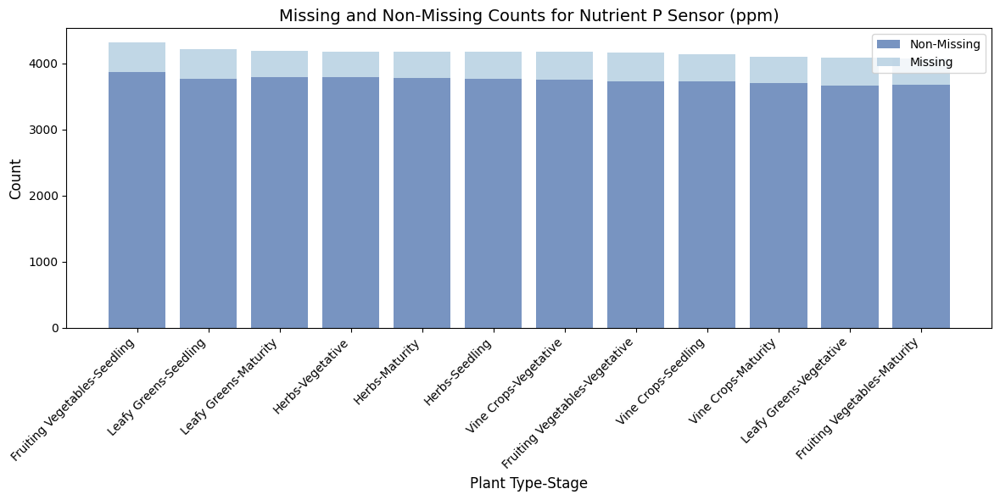

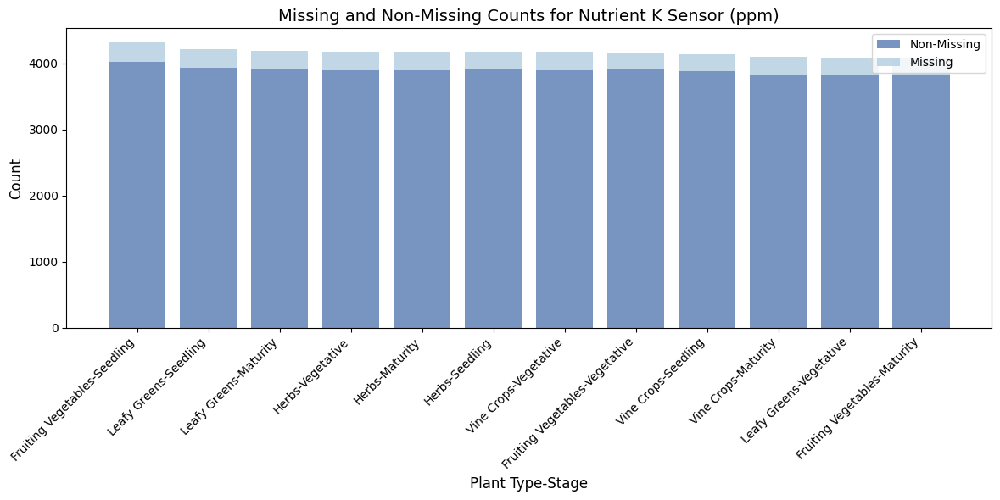

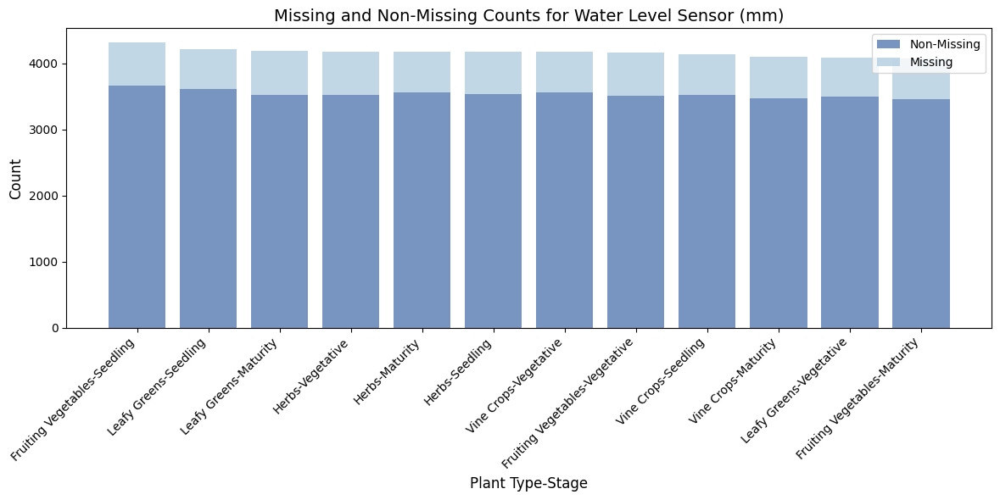

In [33]:
# List of columns with missing values
columns_with_missing = [
    'Temperature Sensor (°C)',
    'Humidity Sensor (%)',
    'Light Intensity Sensor (lux)',
    'Nutrient N Sensor (ppm)',
    'Nutrient P Sensor (ppm)',
    'Nutrient K Sensor (ppm)',
    'Water Level Sensor (mm)'
]

# Grouping and calculating non-missing and missing counts
missing_counts = {}
for column in columns_with_missing:
    missing_counts[column] = plants_df.groupby('Plant Type-Stage')[column].count()

# Creating bar charts for each column
for column, counts in missing_counts.items():
    # Total counts for each Plant Type-Stage
    total_counts = plants_df['Plant Type-Stage'].value_counts()

    # Convert to DataFrame for easier handling
    counts_df = counts.to_frame(name='Non-Missing Count')
    counts_df['Missing Count'] = total_counts - counts_df['Non-Missing Count']

    # Sort by total counts (descending order for intuitive visualization)
    counts_df['Total Count'] = total_counts
    counts_df = counts_df.sort_values('Total Count', ascending=False)

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(
        counts_df.index,
        counts_df['Non-Missing Count'],
        label='Non-Missing',
        color='#6082B6',
        alpha=0.85
    )
    plt.bar(
        counts_df.index,
        counts_df['Missing Count'],
        label='Missing',
        color='#B6D0E2',
        alpha=0.85,
        bottom=counts_df['Non-Missing Count']
    )
    plt.title(f"Missing and Non-Missing Counts for {column}", fontsize=14)
    plt.xlabel("Plant Type-Stage", fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.legend()
    plt.tight_layout()
    plt.show()


Sample size for each Plant type-Stage is enough to calculate a fairly accurate median. Missing values comprise a small portion of each of the numeric columns.

#### Pre-processing for Numerical Features

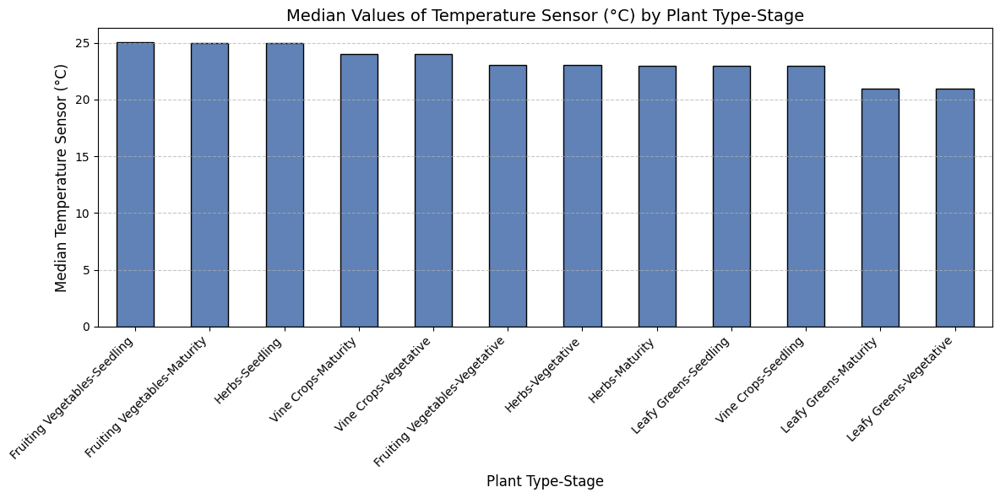

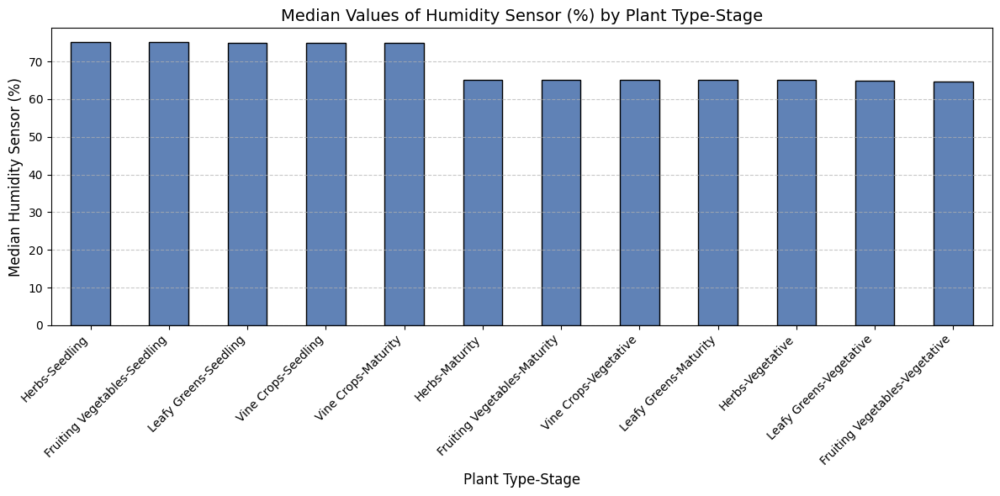

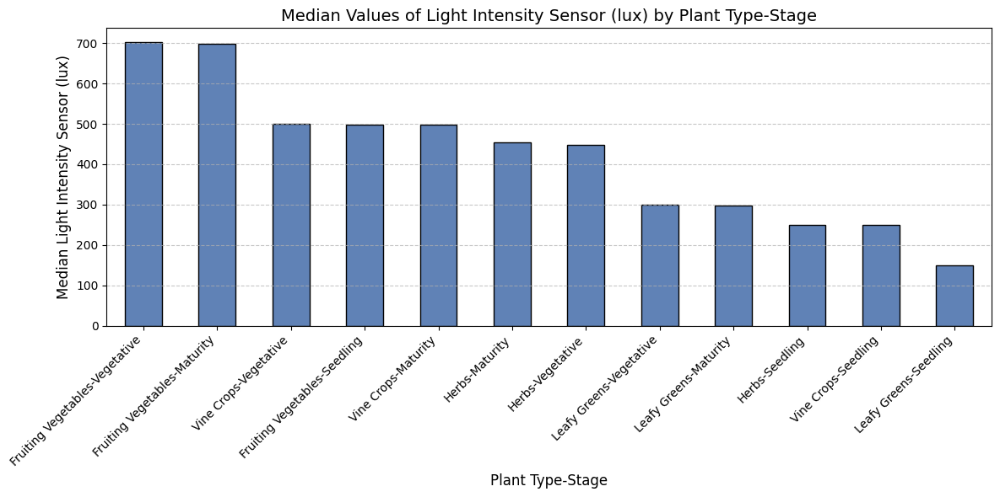

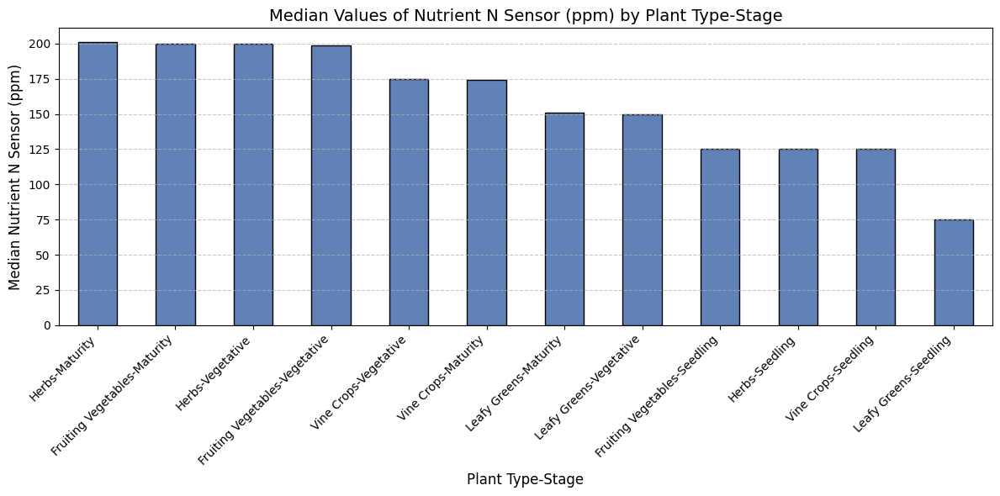

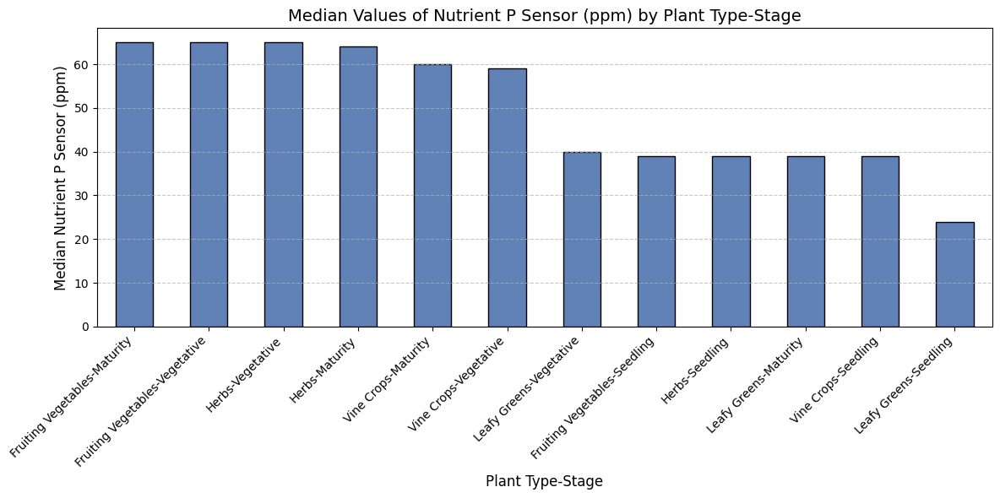

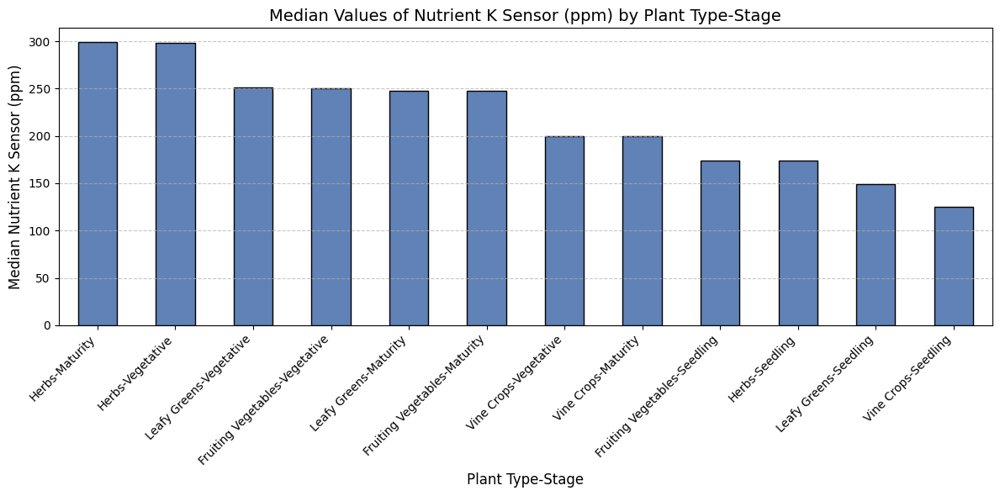

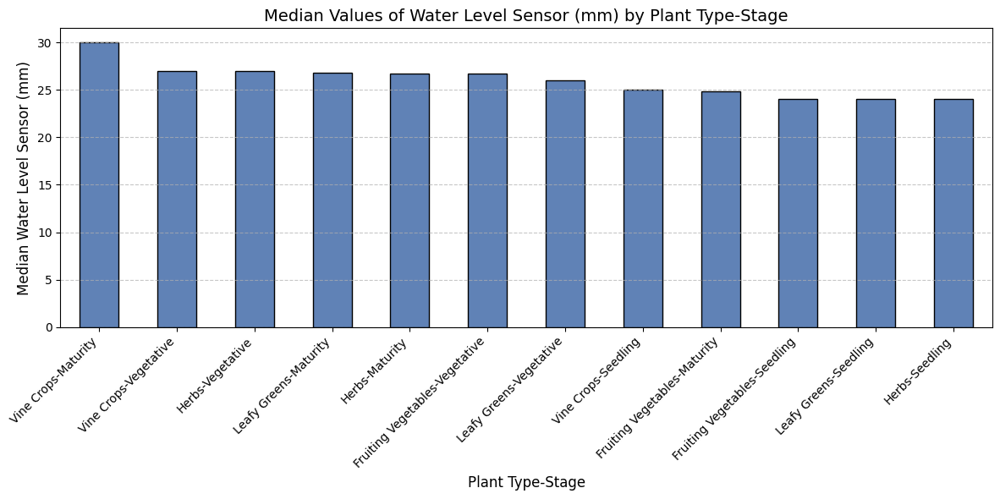

Missing values after replacement:
Temperature Sensor (°C)         0
Humidity Sensor (%)             0
Light Intensity Sensor (lux)    0
Nutrient N Sensor (ppm)         0
Nutrient P Sensor (ppm)         0
Nutrient K Sensor (ppm)         0
Water Level Sensor (mm)         0
dtype: int64


In [34]:
# Plot medians for each column grouped by 'Plant Type-Stage'
for column in columns_with_missing:
    medians = plants_df.groupby('Plant Type-Stage')[column].median()

    # Sort medians in descending order
    medians = medians.sort_values(ascending=False)

    # Create a bar chart
    plt.figure(figsize=(12, 6))
    medians.plot(kind='bar', color='#6082B6', edgecolor='black')  # Adjusting color for visualization
    plt.title(f"Median Values of {column} by Plant Type-Stage", fontsize=14)
    plt.xlabel("Plant Type-Stage", fontsize=12)
    plt.ylabel(f"Median {column}", fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Impute missing data with median values
# Replace missing values with median grouped by 'Plant Type-Stage'
for column in columns_with_missing:
    plants_df[column] = plants_df.groupby('Plant Type-Stage')[column].transform(
        lambda x: x.fillna(x.median())
    )

# Verify if there are still missing values
missing_after_replacement = plants_df[columns_with_missing].isnull().sum()
print("Missing values after replacement:")
print(missing_after_replacement)


From the bar chart displaying the median temperature values for different Plant Type-Stage combinations, it appears that most categories have very similar median temperature values (around 23–25°C).

The median temperatures are quite close across all Plant Type-Stage combinations. This suggests that the dataset might not have significant diversity in temperature values.

Since this data is from a controlled environment, temperature values are likely kept within an optimal range (23–25°C) for plant growth. Hence there is no need to undersample or oversample since we focus on temperatures where plants will thrive in.

If the 18–21°C range is rare or underrepresented, focusing too much on predicting this range might not be operationally significant.


Other columns have variability that separates one plant type-stage from another.

### Prepare for Modelling

#### Relationship between Plant type-Stage and Temperature Sensor

In [39]:
# Group by 'Plant Type' and 'Plant Stage' to calculate the average temperature
average_temp = plants_df.groupby(['Plant Type', 'Plant Stage'])['Temperature Sensor (°C)'].mean().reset_index()


average_temp.columns = ['Plant_Type', 'Plant_Stage', 'Average_Temperature']


print("Average Temperature by Plant Type and Stage:")
print(average_temp)


average_temp.to_csv('average_temperature_by_plant_type_stage.csv', index=False)


Average Temperature by Plant Type and Stage:
             Plant_Type Plant_Stage  Average_Temperature
0   Fruiting Vegetables    Maturity            25.006621
1   Fruiting Vegetables    Seedling            25.022994
2   Fruiting Vegetables  Vegetative            23.020425
3                 Herbs    Maturity            23.000877
4                 Herbs    Seedling            24.984039
5                 Herbs  Vegetative            23.011912
6          Leafy Greens    Maturity            20.992648
7          Leafy Greens    Seedling            22.986458
8          Leafy Greens  Vegetative            20.988292
9            Vine Crops    Maturity            23.996768
10           Vine Crops    Seedling            22.983499
11           Vine Crops  Vegetative            23.985667


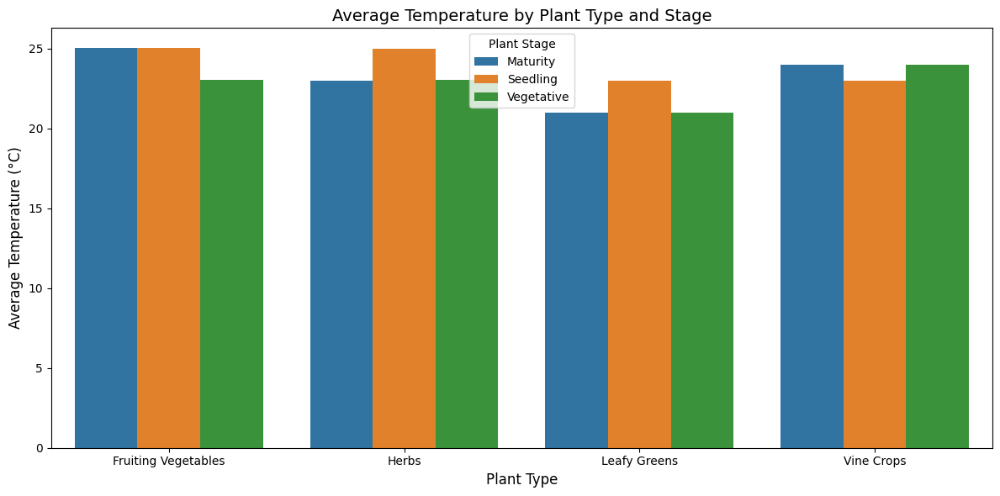

In [40]:



plt.figure(figsize=(12, 6))

# Create a bar chart
sns.barplot(data=average_temp, x='Plant_Type', y='Average_Temperature', hue='Plant_Stage')

# Add labels and title
plt.xlabel("Plant Type", fontsize=12)
plt.ylabel("Average Temperature (°C)", fontsize=12)
plt.title("Average Temperature by Plant Type and Stage", fontsize=14)
plt.legend(title="Plant Stage", fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()


Comparing the plant types using visualisation to see what temperatures each thrives in. There is not much variability in the temperature. It ranges from 21 celsius to 25 celsius.

In [42]:
label_encoders = {col: LabelEncoder() for col in categorical_columns}
for col in categorical_columns:
    plants_df[col] = label_encoders[col].fit_transform(plants_df[col])

# Task 1 - Predict Temperature
# Drop target ('Temperature Sensor (°C)') and irrelevant column ('Plant Type-Stage') for Task 1
X_task1 = plants_df.drop(columns=['Temperature Sensor (°C)', 'Plant Type-Stage'])
y_task1 = plants_df['Temperature Sensor (°C)']

# Task 2 - Categorize Plant Type-Stage
# Drop only target column ('Plant Type-Stage') for Task 2
# See whether to drop temperature sensor or 'Temperature_Binned'
X_task2 = plants_df.drop(columns=['Plant Type-Stage'])
y_task2 = plants_df['Plant Type-Stage']


# Encode the target variable (Plant Type-Stage)
label_encoder_target = LabelEncoder()
y_task2 = label_encoder_target.fit_transform(y_task2)

# Train-test split for both tasks
X_task1_train, X_task1_test, y_task1_train, y_task1_test = train_test_split(X_task1, y_task1, test_size=0.2, random_state=42)
X_task2_train, X_task2_test, y_task2_train, y_task2_test = train_test_split(X_task2, y_task2, test_size=0.2, random_state=42)

##Task 1

### Random Forest Regressor

In [44]:

# Define the Random Forest model
rf = RandomForestRegressor(random_state=42)


param_grid = {
    'max_depth': [3, 4, 5],
    'min_samples_split': [300, 1000],  # Requires at least 300–1000 samples to split
    'min_samples_leaf': [300, 1000],   # Requires at least 300–1000 samples in each leaf
    'max_leaf_nodes': range(5, 15)     # Directly limits the number of leaves
}


# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',  # Negative MSE for scoring
    verbose=2,
    n_jobs=-1
)

# Fit the model with GridSearchCV
grid_search.fit(X_task1_train, y_task1_train)

# Best parameters from GridSearchCV
print("Best Hyperparameters:", grid_search.best_params_)

# Cross-validation (CV) score
best_cv_score = -grid_search.best_score_  # Convert negative MSE to positive MSE
print(f"Best Cross-Validation Mean Squared Error (MSE): {best_cv_score:.4f}")
print(f"Best Cross-Validation Root Mean Squared Error (RMSE): {np.sqrt(best_cv_score):.4f}")

# Train the best model on the entire training set
best_rf = grid_search.best_estimator_

# Evaluate the model on the test set
y_pred = best_rf.predict(X_task1_test)

# Test Mean Squared Error
mse = mean_squared_error(y_task1_test, y_pred)
rmse = np.sqrt(mse)
print(f"Test Mean Squared Error (MSE): {mse:.4f}")
print(f"Test Root Mean Squared Error (RMSE): {rmse:.4f}")

# Calculate R² Score
r2_score_test = r2_score(y_task1_test, y_pred)
print(f"Test R² Score: {r2_score_test:.4f}")

# Feature Importance (Optional)
feature_importances = best_rf.feature_importances_
print("\nFeature Importances:")
for name, importance in zip(X_task1_train.columns, feature_importances):
    print(f"{name}: {importance:.4f}")

Fitting 5 folds for each of 120 candidates, totalling 600 fits


/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best Hyperparameters: {'max_depth': 5, 'max_leaf_nodes': 14, 'min_samples_leaf': 300, 'min_samples_split': 300}
Best Cross-Validation Mean Squared Error (MSE): 0.8963
Best Cross-Validation Root Mean Squared Error (RMSE): 0.9467
Test Mean Squared Error (MSE): 0.8706
Test Root Mean Squared Error (RMSE): 0.9330
Test R² Score: 0.6458

Feature Importances:
System Location Code: 0.0000
Previous Cycle Plant Type: 0.0000
Plant Type: 0.2335
Plant Stage: 0.0298
Humidity Sensor (%): 0.4288
Light Intensity Sensor (lux): 0.0460
CO2 Sensor (ppm): 0.0026
EC Sensor (dS/m): 0.0000
O2 Sensor (ppm): 0.0000
Nutrient N Sensor (ppm): 0.0014
Nutrient P Sensor (ppm): 0.2383
Nutrient K Sensor (ppm): 0.0196
pH Sensor: 0.0000
Water Level Sensor (mm): 0.0000


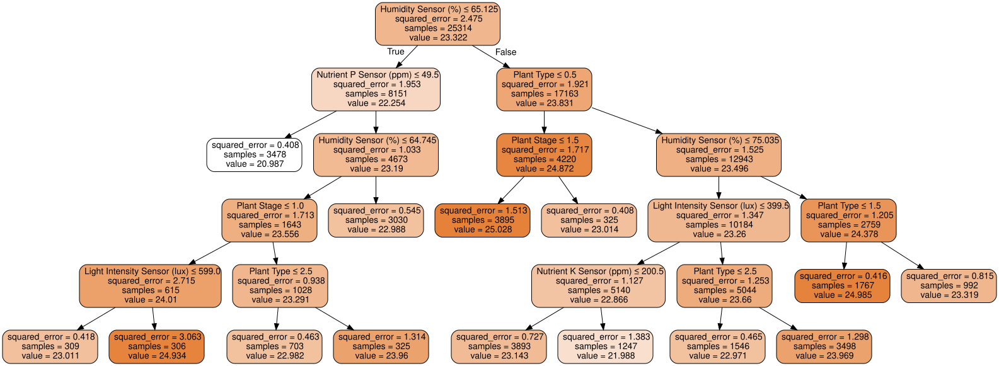

In [45]:


# Extract one tree from the trained Random Forest
single_tree = best_rf.estimators_[0]

# Export the tree structure to a .dot file
dot_data = export_graphviz(
    single_tree,
    out_file=None,  # Keep it in memory
    feature_names=X_task1_train.columns,  # Feature names
    filled=True,  # Add colors to nodes
    rounded=True,  # Rounded corners
    special_characters=True  # Allow special characters
)

# Use graphviz to render the tree
graph = graphviz.Source(dot_data)
graph.render("random_forest_tree", format="png")  # Save to a file (optional)
graph.view()  # Open the rendered tree

# To display inline in a Jupyter Notebook
graph



### XGBoost

In [47]:


# Define the XGBoost model
xgb = XGBRegressor(random_state=42, objective='reg:squarederror')

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 200],     # Number of boosting stages
    'learning_rate': [0.01, 0.05, 0.1],# Step size for updates
    'max_depth': [3, 4, 5],            # Depth of each tree
    'min_child_weight': [1, 5, 10],    # Minimum sum of instance weights needed in a child node
    'subsample': [0.8, 1.0],           # Fraction of samples for training each tree
    'colsample_bytree': [0.8, 1.0]     # Fraction of features used for each tree
}

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    verbose=2,
    n_jobs=-1
)

# Fit the model with GridSearchCV
grid_search.fit(X_task1_train, y_task1_train)

# Best parameters from GridSearchCV
print("Best Hyperparameters:", grid_search.best_params_)

# Cross-validation (CV) score
best_cv_score = -grid_search.best_score_  # Convert negative MSE to positive MSE
print(f"Best Cross-Validation Mean Squared Error (MSE): {best_cv_score:.4f}")
print(f"Best Cross-Validation Root Mean Squared Error (RMSE): {np.sqrt(best_cv_score):.4f}")

# Train the best model on the entire training set
best_xgb = grid_search.best_estimator_

# Evaluate the model on the test set
y_pred = best_xgb.predict(X_task1_test)

# Test Mean Squared Error
mse = mean_squared_error(y_task1_test, y_pred)
rmse = np.sqrt(mse)
print(f"Test Mean Squared Error (MSE): {mse:.4f}")
print(f"Test Root Mean Squared Error (RMSE): {rmse:.4f}")

# Calculate R² Score
r2_score_test = r2_score(y_task1_test, y_pred)
print(f"Test R² Score: {r2_score_test:.4f}")

# Feature Importance (Optional)
feature_importances = best_xgb.feature_importances_
print("\nFeature Importances:")
for name, importance in zip(X_task1_train.columns, feature_importances):
    print(f"{name}: {importance:.4f}")


Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Best Hyperparameters: {'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 1.0}
Best Cross-Validation Mean Squared Error (MSE): 0.7487
Best Cross-Validation Root Mean Squared Error (RMSE): 0.8653
Test Mean Squared Error (MSE): 0.7495
Test Root Mean Squared Error (RMSE): 0.8657
Test R² Score: 0.6950

Feature Importances:
System Location Code: 0.0016
Previous Cycle Plant Type: 0.0027
Plant Type: 0.2446
Plant Stage: 0.1183
Humidity Sensor (%): 0.2539
Light Intensity Sensor (lux): 0.0528
CO2 Sensor (ppm): 0.0141
EC Sensor (dS/m): 0.0019
O2 Sensor (ppm): 0.0064
Nutrient N Sensor (ppm): 0.0402
Nutrient P Sensor (ppm): 0.2009
Nutrient K Sensor (ppm): 0.0585
pH Sensor: 0.0022
Water Level Sensor (mm): 0.0020


### Neural Network

Standardized Numerical Columns (Training):
       Humidity Sensor (%)  Light Intensity Sensor (lux)  CO2 Sensor (ppm)  \
44969            -0.306375                     -0.384151         -0.478586   
35538             1.558903                     -0.728073          0.113347   
52117            -0.793388                     -0.277027          0.629837   
18851            -0.770288                      0.749102          2.115473   
15713             1.137338                     -0.987425          0.241019   

       EC Sensor (dS/m)  O2 Sensor (ppm)  Nutrient N Sensor (ppm)  \
44969          0.305503        -0.508992                -1.055621   
35538         -2.478634         0.363690                -0.740668   
52117         -0.078516        -0.508992                 0.384161   
18851          1.601566         1.236373                 1.261529   
15713         -0.318528        -0.508992                -0.695675   

       Nutrient P Sensor (ppm)  Nutrient K Sensor (ppm)  pH Sensor  \
449

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 112.7046 - mae: 7.2131 - val_loss: 3.1778 - val_mae: 1.3850
Epoch 2/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 2.3487 - mae: 1.1940 - val_loss: 1.2688 - val_mae: 0.8690
Epoch 3/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.1418 - mae: 0.8273 - val_loss: 0.9691 - val_mae: 0.7531
Epoch 4/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.9489 - mae: 0.7474 - val_loss: 1.0254 - val_mae: 0.7897
Epoch 5/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.8882 - mae: 0.7148 - val_loss: 0.8770 - val_mae: 0.7108
Epoch 6/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.8685 - mae: 0.7073 - val_loss: 0.8167 - val_mae: 0.6736
Epoch 7/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.8329 - mae: 0.6907 - val_loss: 0.8063 - val_mae: 0.6671
Epoch 8/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.8096 - mae: 0.6778 - val_loss: 0.8058 - val_mae: 0.6680
Epoch 9/50
1250/1250 ━━━━━━━━━━━━━━━━━

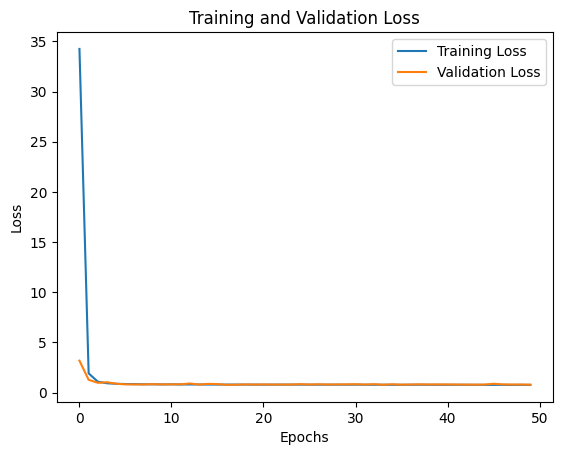

In [48]:
# Define numerical_columns (Exclude 'Temperature Sensor (°C)')
numerical_columns = ['Humidity Sensor (%)', 'Light Intensity Sensor (lux)', 'CO2 Sensor (ppm)',
                     'EC Sensor (dS/m)', 'O2 Sensor (ppm)', 'Nutrient N Sensor (ppm)',
                     'Nutrient P Sensor (ppm)', 'Nutrient K Sensor (ppm)',
                     'pH Sensor', 'Water Level Sensor (mm)']

# Ensure 'Temperature Sensor (°C)' is not in the list
assert 'Temperature Sensor (°C)' not in numerical_columns

# Standardize numerical columns after train-test split
scaler = StandardScaler()

# Apply scaling to numerical columns in X_task1_train and X_task1_test
X_task1_train[numerical_columns] = scaler.fit_transform(X_task1_train[numerical_columns])
X_task1_test[numerical_columns] = scaler.transform(X_task1_test[numerical_columns])

# Verify the result
print("Standardized Numerical Columns (Training):")
print(X_task1_train[numerical_columns].head())

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt

# Define the Neural Network model
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_task1_train.shape[1],)),  # Input layer
    Dense(32, activation='relu'),  # Hidden layer
    Dense(1)  # Output layer for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mse', metrics=['mae'])  # Mean Squared Error and Mean Absolute Error

# Train the model
history = model.fit(
    X_task1_train, y_task1_train,
    validation_data=(X_task1_test, y_task1_test),
    epochs=50,  # Adjust as needed
    batch_size=32,
    verbose=1
)

# Evaluate the model on the test set
loss, mae = model.evaluate(X_task1_test, y_task1_test, verbose=0)
print(f"Test Mean Absolute Error (MAE): {mae:.4f}")

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.show()


In [49]:
# Make predictions using the Neural Network
y_pred_nn = model.predict(X_task1_test).flatten()  # Flatten the predictions for comparison

# Calculate MSE
mse_nn = mean_squared_error(y_task1_test, y_pred_nn)
print(f"Neural Network Test MSE: {mse_nn:.4f}")

# Calculate RMSE
rmse_nn = np.sqrt(mse_nn)
print(f"Neural Network Test RMSE: {rmse_nn:.4f}")

# Calculate R² Score
r2_nn = r2_score(y_task1_test, y_pred_nn)
print(f"Neural Network Test R² Score: {r2_nn:.4f}")

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Neural Network Test MSE: 0.7849
Neural Network Test RMSE: 0.8859
Neural Network Test R² Score: 0.6806



Both training and validation loss drop significantly, which is expected as the model learns patterns from the data.

Both losses stabilize and stay close to each other, indicating the model is generalizing well to unseen data.

The validation loss closely follows the training loss without a significant gap, suggesting the model isn't overfitting.

Random Forest Regressor:

Best Cross-Validation Mean Squared Error (MSE): 0.8963

Best Cross-Validation Root Mean Squared Error (RMSE): 0.9467

Test Mean Squared Error (MSE): 0.8706

Test Root Mean Squared Error (RMSE): 0.9330

Test R² Score: 0.6458



XGBoost:

Best Hyperparameters: {'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 1.0}

Best Cross-Validation Mean Squared Error (MSE): 0.7487

Best Cross-Validation Root Mean Squared Error (RMSE): 0.8653

Test Mean Squared Error (MSE): 0.7495

Test Root Mean Squared Error (RMSE): 0.8657

Test R² Score: 0.6950


Neural Network:

Neural Network Test MSE: 0.7849

Neural Network Test RMSE: 0.8859

Neural Network Test R² Score: 0.6806

## Task 2

#### Random Forest Classifier

In [50]:

rf_classifier = RandomForestClassifier(random_state=42)


param_grid = {
    'max_depth': [3, 4, 5],
    'min_samples_split': [300, 1000],  # Requires at least 300–1000 samples to split
    'min_samples_leaf': [300, 1000],   # Requires at least 300–1000 samples in each leaf
    'max_leaf_nodes': range(5, 15)     # Directly limits the number of leaves
}
# 4. **Hyperparameter Tuning with GridSearchCV**
grid_search = GridSearchCV(
    estimator=rf_classifier,
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',  # Use accuracy for scoring
    verbose=2,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_task2_train, y_task2_train)

# Best Parameters
print("Best Hyperparameters:", grid_search.best_params_)

# Best Cross-Validation Score
best_cv_score = grid_search.best_score_
print(f"Best Cross-Validation Accuracy: {best_cv_score:.4f}")

# Train the Best Model
best_rf_classifier = grid_search.best_estimator_

# 5. **Evaluate on Test Data**
y_pred_task2 = best_rf_classifier.predict(X_task2_test)

# Accuracy
accuracy = accuracy_score(y_task2_test, y_pred_task2)
print(f"Test Accuracy: {accuracy:.4f}")

# Classification Report
print("\nClassification Report:")
print(classification_report(y_task2_test, y_pred_task2, target_names=label_encoder_target.classes_))

# Confusion Matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_task2_test, y_pred_task2))

# 6. **Feature Importance (Optional)**
feature_importances = best_rf_classifier.feature_importances_
print("\nFeature Importances:")
for name, importance in zip(X_task2.columns, feature_importances):
    print(f"{name}: {importance:.4f}")

Fitting 5 folds for each of 120 candidates, totalling 600 fits
Best Hyperparameters: {'max_depth': 5, 'max_leaf_nodes': 13, 'min_samples_leaf': 300, 'min_samples_split': 1000}
Best Cross-Validation Accuracy: 0.9998
Test Accuracy: 0.9997

Classification Report:
                                precision    recall  f1-score   support

  Fruiting Vegetables-Maturity       1.00      1.00      1.00       837
  Fruiting Vegetables-Seedling       1.00      1.00      1.00       841
Fruiting Vegetables-Vegetative       1.00      1.00      1.00       845
                Herbs-Maturity       1.00      1.00      1.00       815
                Herbs-Seedling       1.00      1.00      1.00       833
              Herbs-Vegetative       1.00      1.00      1.00       810
         Leafy Greens-Maturity       1.00      1.00      1.00       849
         Leafy Greens-Seedling       1.00      1.00      1.00       849
       Leafy Greens-Vegetative       1.00      1.00      1.00       797
           Vine Cr

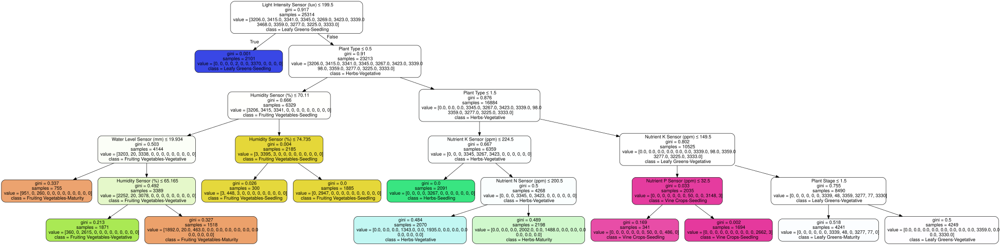

In [51]:

# Extract one tree from the trained Random Forest
single_tree = best_rf_classifier.estimators_[0]

# Export the tree structure to a .dot file
dot_data = export_graphviz(
    single_tree,
    out_file=None,  # Keep it in memory
    feature_names=X_task2_train.columns,  # Feature names
    class_names=label_encoder_target.classes_,  # Class names
    filled=True,  # Add colors to nodes
    rounded=True,  # Rounded corners
    special_characters=True  # Allow special characters
)

# Use graphviz to render the tree
graph = graphviz.Source(dot_data)
graph.render("random_forest_tree_task2", format="png")  # Save to a file (optional)
graph.view()  # Open the rendered tree

# To display inline in a Jupyter Notebook
graph


#### XGBoost

In [52]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Define the XGBoost model
xgb_classifier = XGBClassifier(
    objective='multi:softmax',  # Multi-class classification
    num_class=len(label_encoder_target.classes_),  # Number of classes
    random_state=42,
    use_label_encoder=False
)

# Define hyperparameter grid for tuning (if needed)
xgb_param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [5, 10, 15],
    'n_estimators': [50, 100, 200],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Perform Grid Search for hyperparameter tuning (Optional)
xgb_grid_search = GridSearchCV(
    estimator=xgb_classifier,
    param_grid=xgb_param_grid,
    cv=5,
    scoring='accuracy',
    verbose=2,
    n_jobs=-1
)

# Train the model
xgb_grid_search.fit(X_task2_train, y_task2_train)

# Best model
best_xgb_model = xgb_grid_search.best_estimator_
print("Best Hyperparameters:", xgb_grid_search.best_params_)

# Evaluate on test set
y_pred_xgb = best_xgb_model.predict(X_task2_test)

# Evaluation metrics
print("XGBoost Test Accuracy:", accuracy_score(y_task2_test, y_pred_xgb))
print("\nClassification Report (XGBoost):")
print(classification_report(y_task2_test, y_pred_xgb, target_names=label_encoder_target.classes_))
print("\nConfusion Matrix (XGBoost):")
print(confusion_matrix(y_task2_test, y_pred_xgb))


Fitting 5 folds for each of 108 candidates, totalling 540 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [08:29:52] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best Hyperparameters: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
XGBoost Test Accuracy: 0.9999

Classification Report (XGBoost):
                                precision    recall  f1-score   support

  Fruiting Vegetables-Maturity       1.00      1.00      1.00       837
  Fruiting Vegetables-Seedling       1.00      1.00      1.00       841
Fruiting Vegetables-Vegetative       1.00      1.00      1.00       845
                Herbs-Maturity       1.00      1.00      1.00       815
                Herbs-Seedling       1.00      1.00      1.00       833
              Herbs-Vegetative       1.00      1.00      1.00       810
         Leafy Greens-Maturity       1.00      1.00      1.00       849
         Leafy Greens-Seedling       1.00      1.00      1.00       849
       Leafy Greens-Vegetative       1.00      1.00      1.00       797
           Vine Crops-Maturity       1.00      1.00      1.00       839
           Vine C

#### Neural Network Classifier

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1250/1250 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8156 - loss: 0.6774 - val_accuracy: 0.9999 - val_loss: 0.0044
Epoch 2/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9999 - loss: 0.0034 - val_accuracy: 1.0000 - val_loss: 0.0011
Epoch 3/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9999 - loss: 0.0010 - val_accuracy: 1.0000 - val_loss: 4.0223e-04
Epoch 4/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 1.0000 - loss: 3.9886e-04 - val_accuracy: 1.0000 - val_loss: 1.7836e-04
Epoch 5/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 1.0000 - loss: 1.6119e-04 - val_accuracy: 1.0000 - val_loss: 8.8343e-05
Epoch 6/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 1.0000 - loss: 7.1393e-05 - val_accuracy: 1.0000 - val_loss: 5.1070e-05
Epoch 7/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 1.0000 - loss: 3.2448e-05 - val_accuracy: 1.0000 - val_loss: 3.0225e-05
Epoch 8/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy:

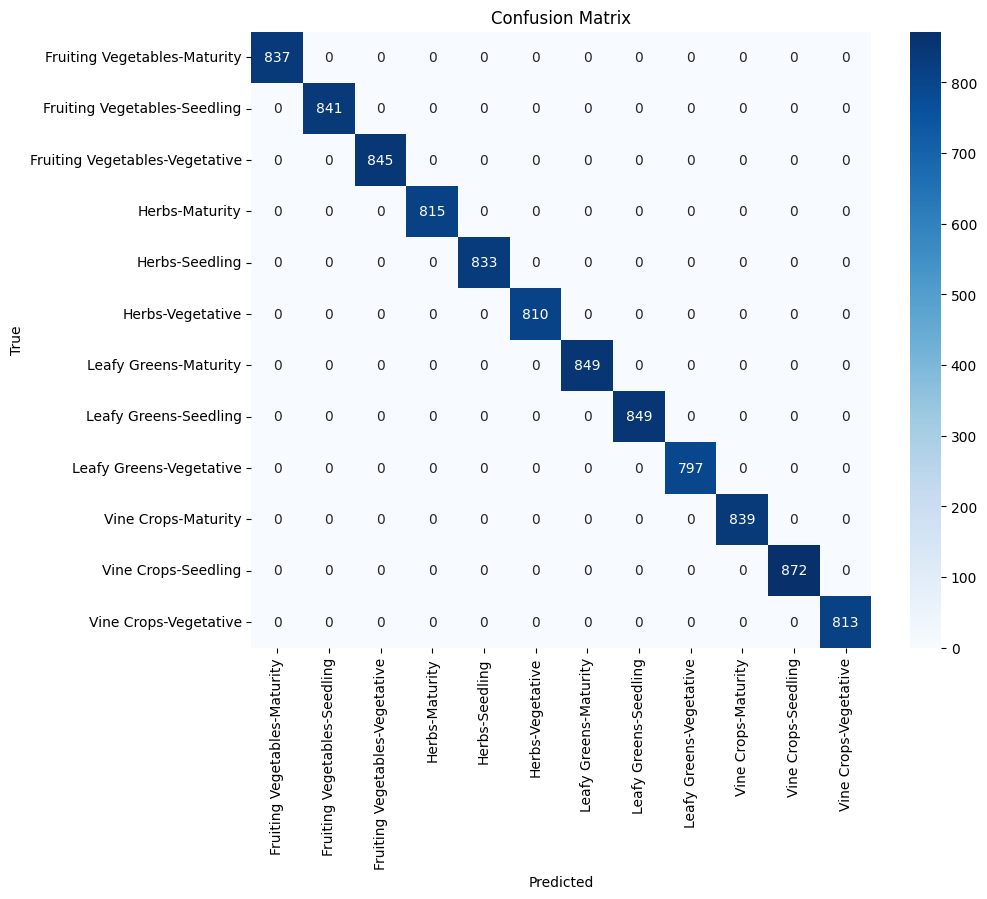

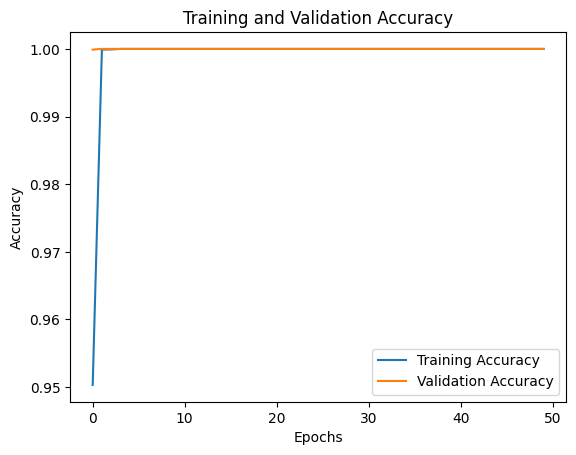

In [53]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Scale the features (Neural Networks require scaling)
scaler = StandardScaler()
X_task2_train_scaled = scaler.fit_transform(X_task2_train)
X_task2_test_scaled = scaler.transform(X_task2_test)

# Define the Neural Network model
nn_model = Sequential([
    Dense(64, activation='relu', input_shape=(X_task2_train_scaled.shape[1],)),  # Input layer
    Dense(32, activation='relu'),  # Hidden layer
    Dense(len(label_encoder_target.classes_), activation='softmax')  # Output layer for multi-class classification
])

# Compile the model
nn_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = nn_model.fit(
    X_task2_train_scaled, y_task2_train,
    validation_data=(X_task2_test_scaled, y_task2_test),
    epochs=50,  # Adjust as needed
    batch_size=32,
    verbose=1
)

# Evaluate on the test set
test_loss, test_accuracy = nn_model.evaluate(X_task2_test_scaled, y_task2_test, verbose=0)
print(f"Neural Network Test Accuracy: {test_accuracy:.4f}")

# Predict class probabilities and convert to class labels
y_pred_proba = nn_model.predict(X_task2_test_scaled)
y_pred = np.argmax(y_pred_proba, axis=1)

# Generate Classification Report
print("\nClassification Report:")
print(classification_report(y_task2_test, y_pred, target_names=label_encoder_target.classes_))

# Generate Confusion Matrix
print("\nConfusion Matrix:")
conf_matrix = confusion_matrix(y_task2_test, y_pred)
print(conf_matrix)

# Plot the confusion matrix as a heatmap
import seaborn as sns
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder_target.classes_, yticklabels=label_encoder_target.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.show()
